<h1 style="text-align:center;background-color:DarkTurquoise; color:Teal; font-size: 40px">3. Surveying the Seas of Recipe Data
<img src="https://uploads-ssl.webflow.com/615bf2d50c4d2f10541ef9a1/61d48ffd38497b2c56571a0d_Univ.AI%20Logo_darkbg.svg" style="width:200px;height:200px;"></h1>
<div class="alert alert-info" role="alert">
  <b>Team :</b><br>
  <span style="color: Teal; font-weight: bold; font-size: 40px">The Sentient Chef </span><br>
  <span style="color: LightSeaGreen; font-weight: bold; font-size: 20px;">Univ.AI DS-1 C5 Final Project</span><br><br>
  <b>Voyage Controller :</b><br>
  <span style="color: LightSeaGreen; font-weight: bold;">Shibani Budhraja </span><br><br>
  <b>On Board Crews :</b><br>
  <span style="color: LightSeaGreen; font-weight: bold;">1. Swarnava Bhattacharjee</span><br>
  <span style="color: LightSeaGreen; font-weight: bold;">2. Karthik Rathod</span><br>
  <span style="color: LightSeaGreen; font-weight: bold;">3. Yamuna Katta</span><br>
  <span style="color: LightSeaGreen; font-weight: bold;">4. Venkatesh BY</span><br></div>

![eda](https://i.imgur.com/zOc8WwA.jpeg)

<h1 style="text-align:left;background-color:#48C9B0; color:white" >Importing Nessesary libraries :</h1>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import ast
import os
warnings.filterwarnings('ignore')
sns.set_theme(context='notebook', style='darkgrid', palette='deep', font='sans-serif', font_scale=1, color_codes=True)

<h1 style="text-align:left;background-color:#48C9B0; color:white" >Datasets :</h1>

In [2]:
# Reading the dataset
df_diet_type = pd.read_csv('/kaggle/input/the-sentiend-chef-eda-data/df_diet_type.csv')
df_diet_type = df_diet_type.rename(columns={'Contient': 'Continent'})
EDA_master_df = pd.read_csv('/kaggle/input/sentient-chef-eda-data/EDA_master_df.csv')
eda_df_states= pd.read_csv('/kaggle/input/sentient-chef-eda-data/eda_df_states.csv')
df_State = pd.read_csv('/kaggle/input/the-sentiend-chef-eda-data/US_by_state_diet_type.csv')

<h1 style="text-align:center;background-color:#EC7063; color:white" >Which Countries/States Recipe Requires Highest/Lowest Cook Time ? </h1>

<h2 style="text-align:left;background-color:#48C9B0; color:white" >Defining Functions</h2>

In [3]:
def median_time(input_df, continent, columns, width=0.8, rotation=0):
    """
    Calculate the median of one or more columns of a DataFrame grouped by Country_State or State, and plot the results in a Seaborn subplot.

    Args:
        input_df (pd.DataFrame): The input DataFrame.
        continent (str): The continent to filter the data by. If set to 'USA', the data is grouped by State instead of Country_State.
        columns (list of str): The columns to calculate the median for and plot.
        width (float, optional): The width of the bars in the plot. Default is 0.8.
        rotation (float, optional): The rotation angle of the x-axis tick labels. Default is 0.

    Returns:
        None.

    Raises:
        None.
    """
    
    if continent != 'USA':
        df_continent = input_df[input_df.Continent == continent].copy()
        df_continent.reset_index(drop=True, inplace=True)
        df_continent.drop(['Continent'], axis=1, inplace=True)
        if continent == 'North America':
            df_continent['Country_State'] = df_continent['Country_State'].apply(lambda x: x.split('/')[0])
            df_continent['Country_State'] = df_continent['Country_State'].replace('USA', 'US')

        n_cols = len(columns)
        fig, axes = plt.subplots(nrows=1, ncols=n_cols, figsize=(16, 4))
        fig.suptitle(f'{continent} Continent', fontsize=18, color='#0E6655')
        fig.set_facecolor('#A3E4D7')
        for i, col in enumerate(columns):
            # Group by country_state and calculate median 
            median_time_by_country = df_continent.groupby('Country_State')[col].median()

            # Sort the data by median time in descending order
            median_time_by_country = median_time_by_country.sort_values(ascending=False)

            # Create a color palette for the bar plot
            n_colors = len(median_time_by_country)
            colors = sns.color_palette('RdYlGn_r', n_colors=n_colors)

            # Create the bar plot using Seaborn
            sns.barplot(y=median_time_by_country.index, x=median_time_by_country.values, palette=colors,width=width, ax=axes[i], orient='h')

            # Set the axis labels and tick labels
            axes[i].set_ylabel('Countries',color='#283747',fontsize=12)
            axes[i].set_title(f'Median of {col}', color='#A04000',fontsize=14)
            axes[i].set_xlabel('in Minutes',color='#283747',fontsize=12)
            axes[i].set_yticklabels(labels=median_time_by_country.index, rotation=rotation)
            axes[i].grid(True, linestyle='--',alpha=0.4)
        # Show the plot
        fig.tight_layout()
        fig.savefig(f'Median_time_{continent}.png',dpi=150)
        plt.show()
    else:

        n_cols = len(columns)
        fig, axes = plt.subplots(nrows=1, ncols=n_cols, figsize=(16, 10))
        fig.suptitle(f'States for {continent}', fontsize=18, color='#154360')
        fig.set_facecolor('#A3E4D7')

        for i, col in enumerate(columns):
            # Group by state and calculate median 
            median_time_by_state = input_df.groupby('State')[col].median()

            # Sort the data by median time in descending order
            median_time_by_state = median_time_by_state.sort_values(ascending=False)

            # Create a color palette for the bar plot
            n_colors = len(median_time_by_state)
            colors = sns.color_palette('RdYlGn_r', n_colors=n_colors)
            
            # Create the bar plot using Seaborn
            sns.barplot(y=median_time_by_state.index, x=median_time_by_state.values, palette=colors,width=width, ax=axes[i], orient='h')

            # Set the axis labels and tick labels
            axes[i].set_ylabel('States',color='#283747',fontsize=12)
            axes[i].set_title(f'Median of {col}', color='#A04000',fontsize=14)
            axes[i].set_xlabel('in Minutes',color='#283747',fontsize=12)
            axes[i].set_yticklabels(labels=median_time_by_state.index, rotation=rotation)
            axes[i].grid(True, linestyle='--',alpha=0.4)
        # Set the title and labels
        fig.tight_layout()
        fig.savefig(f'Median_time_{continent}.png',dpi=200)
        plt.show()



<h2 style="text-align:center;background-color:#2980B9; color:white" >1. North America :</h2>

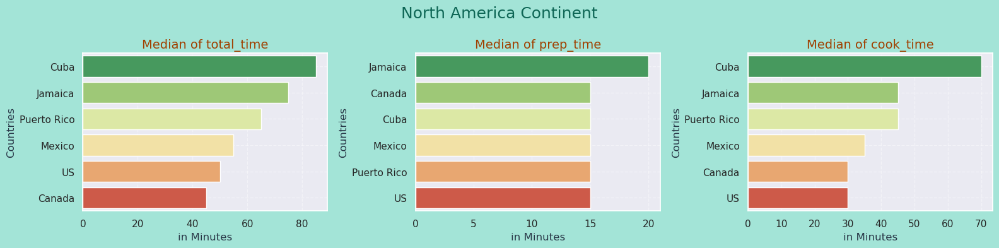

In [4]:
median_time(df_diet_type,'North America',['total_time','prep_time','cook_time'])

<div class="alert alert-warning" role="alert">
    <b>Observation :</b> <br>
    <br>
    <ul>
        <li><b>Median of Total Time:</b> Cuba has highest around 85 min and Canada has lowest around 45 min.</li>
        <li><b>Median of Prep Time:</b> Jamaica has highest around 20 min and USA and other has the same around 15 min.</li>
        <li><b>Median of Cook Time:</b> Cuba has highest aaround 70 min nd Canada and USA has lowest around 30 min.</li>
    </ul>
</div> 

<h3 style="text-align:center;background-color:#2980B9; color:white" >1.2. United States of America :</h3>

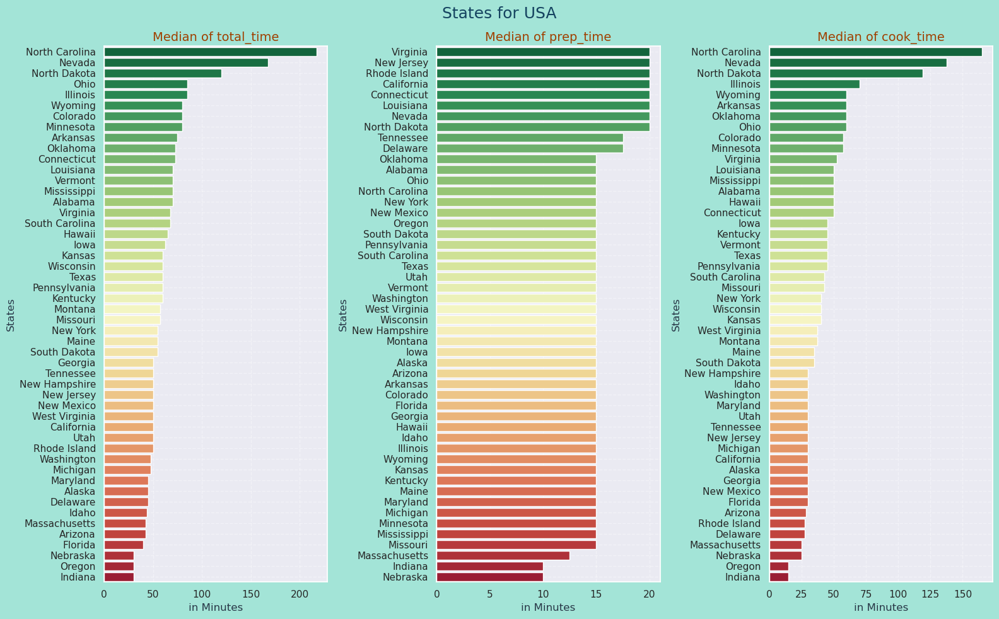

In [5]:
median_time(df_State,'USA',['total_time','prep_time','cook_time'])

<div class="alert alert-warning" role="alert">
    <b>Observation :</b> <br>
    <br>
    <ul>
        <li><b>Median of Total Time:</b> North Carolina has highest over 200 min and Nebraska, Oregon,Indiana has lowest around 30 min.</li>
        <li><b>Median of Prep Time:</b> Jamaica has highest around 20 min and Nebraska and Indiana has the same around 10 min.</li>
        <li><b>Median of Cook Time:</b> Cuba has highest over 150 min and Oregon and indiana has lowest around 20 min.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >2. South America :</h2>

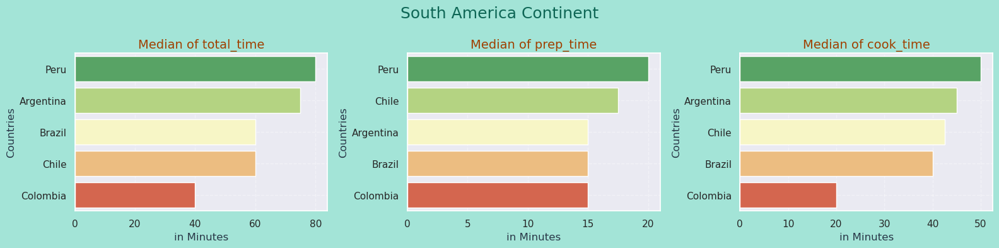

In [6]:
median_time(df_diet_type,'South America',['total_time','prep_time','cook_time'])

<div class="alert alert-warning" role="alert">
    <b>Observation :</b> <br>
    <br>
    <ul>
        <li><b>Median of Total Time:</b> Peru has highest over 80 min and Colombia has lowest around 40 min.</li>
        <li><b>Median of Prep Time:</b> Peru has highest around 20 min and Argentina, Brazil, Colombia has the same around 15 min.</li>
        <li><b>Median of Cook Time:</b> Peru has highest over 50 min and Colombia has lowest around 20 min.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >3. Africa :</h2>

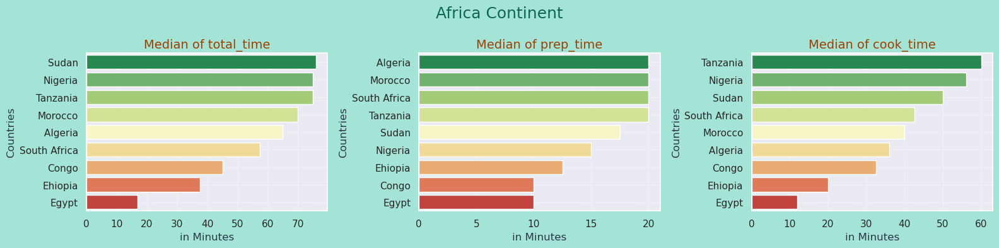

In [7]:
median_time(df_diet_type,'Africa',['total_time','prep_time','cook_time'])

<div class="alert alert-warning" role="alert">
    <b>Observation :</b> <br>
    <br>
    <ul>
        <li><b>Median of Total Time:</b> Sudan has highest over 70 min and Egypt has lowest around 18 min.</li>
        <li><b>Median of Prep Time:</b> Algeria, Morocco, South Africa, Tanzania has highest around 20 min and Congo, Egypt has the same around 10 min.</li>
        <li><b>Median of Cook Time:</b> Tanzania has highest around 60 min and Oregon and Egypt has lowest around 10 min.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" > 4. Australia & New Zealand (Oceania) :</h2>

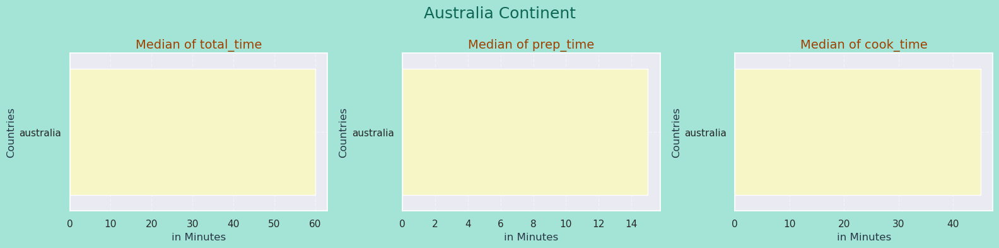

In [8]:
median_time(df_diet_type,'Australia',['total_time','prep_time','cook_time'])

<div class="alert alert-warning" role="alert">
    <b>Observation :</b> <br>
    <br>
    <ul>
        <li><b>Median of Total Time:</b> around 60 min.</li>
        <li><b>Median of Prep Time:</b> around 16 min.</li>
        <li><b>Median of Cook Time:</b> around 45 min.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >5. Europe :</h2>

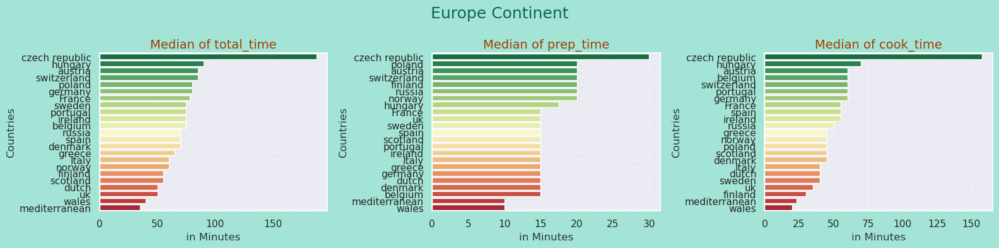

In [9]:
median_time(df_diet_type,'Europe',['total_time','prep_time','cook_time'])

<div class="alert alert-warning" role="alert">
    <b>Observation :</b> <br>
    <br>
    <ul>
        <li><b>Median of Total Time:</b> Czech republic has highest around 180 min and Mediterranean has lowest around 40 min.</li>
        <li><b>Median of Prep Time:</b> Czech republic has highest around 30 min and Mediterranean and Wales has the same around 10 min.</li>
        <li><b>Median of Cook Time:</b> Czech republic has highest over 150 min and Wales has lowest around 20 min.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >6. Asia :</h2>

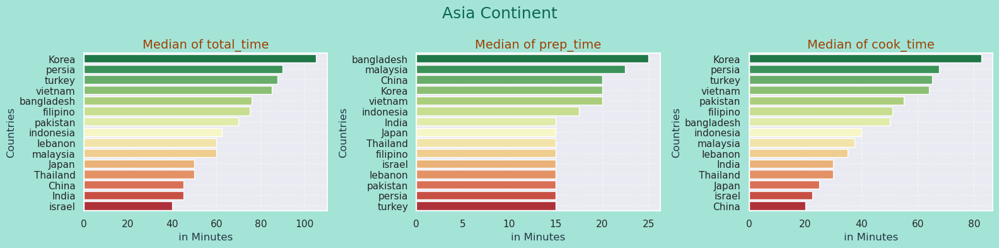

In [10]:
median_time(df_diet_type,'Asia',['total_time','prep_time','cook_time'])

<div class="alert alert-warning" role="alert">
    <b>Observation :</b> <br>
    <br>
    <ul>
        <li><b>Median of Total Time:</b> korea has highest around 100 min and Israel has lowest around 40 min.</li>
        <li><b>Median of Prep Time:</b> Bangladesh has highest around 80 min and India has around 15 min 7th place.</li>
        <li><b>Median of Cook Time:</b> Korea has highest over 25 min and China has lowest around 20 min.</li>
    </ul>
</div> 

<h1 style="text-align:center;background-color:#EC7063; color:white" >How Users Interaction is Influenced by Cooking Time of a Recipe across the Countries/States ? </h1>

<h2 style="text-align:left;background-color:#48C9B0; color:white" >Defining Functions</h2>

In [11]:
def get_hrs(x):
    """
    Convert minutes (x) to hours and return a string representing the range of hours.

    Args:
        x (int): The number of minutes to convert to hours.

    Returns:
        str: A string representing the range of hours based on the input value:
            - "0-0.5" if the number of hours is less than 0.5
            - "0.5-1" if the number of hours is between 0.5 and 1.0
            - "1.0-1.5" if the number of hours is between 1.0 and 1.5
            - "1.5-2" if the number of hours is between 1.5 and 2.0
            - "2-3" if the number of hours is between 2.0 and 3.0
            - "3-5" if the number of hours is between 3.0 and 5.0
            - "5-8" if the number of hours is between 5.0 and 8.0
            - "8+" if the number of hours is greater than 8.0

    Raises:
        None
    """
    h = x/60.0
    if h < 0.5:
        return "0-0.5"
    elif (h>0.5 )&( h < 1.0):
        return "0.5-1"
    elif (h>1.0) & (h < 1.5):
        return "0.5-1"
    elif (h>1.5) & (h < 2.0):
        return "1.5-2"
    elif (h>2.0)& (h < 3.0):
        return "2-3"
    elif (h>3.0) & (h < 5.0):
        return "3-5"
    elif (h>5.0) & (h < 8.0):
        return "5-8"
    elif (h>8.0):
        return "8+"

In [12]:
# funtion to plot time group vs rating
def time_frequency(input_df,continent):
    """
    Plot a bar graph of the distribution of ratings based on time groups for a given continent.

    Parameters:
    input_df (pandas.DataFrame): DataFrame containing ratings data for multiple continents.
    continent (str): The continent to analyze. Can be any of the following: 'Asia', 'Africa', 'North America',
                     'South America', 'Europe', or 'Australia'.

    Returns:
    pandas.DataFrame: DataFrame containing ratings data for the specified continent.
    """
    column = 'Country_State'
    if 'State' in list(input_df.columns):
        column = 'State'
        application_df = input_df.copy(deep=True)
    else:
        df_Continent = input_df[input_df.Continent == continent].copy()
        df_Continent.reset_index(drop=True,inplace=True)
        df_Continent.drop(['Continent'],axis=1,inplace=True)
        if(continent == 'North America'):
            df_Continent[column] = df_Continent[column].apply(lambda x: x.split('/')[0])
            df_Continent[column] = df_Continent[column].replace('USA', 'US')

        application_df = df_Continent.copy(deep=True)
    # create a new column 'time_segment' using get_hrs function
    application_df['time_segment'] = application_df['total_time'].apply(get_hrs)

    # get the frequency counts of each time segment
    time_segment_counts = application_df['time_segment'].value_counts(normalize=True).sort_values(ascending=False)

    # create a seaborn barplot with values on top of bars
    sns.barplot(x=time_segment_counts.index, y=time_segment_counts.values, palette=sns.color_palette("YlOrRd", 8))
    sns.lineplot(x=time_segment_counts.index, y=time_segment_counts.values, color='#2E4053', linewidth=1.5, linestyle='dashed')
    for i, v in enumerate(time_segment_counts.values):
        plt.text(i, v, f"{round(v*100,2)}%", color='#2471A3', ha="center")

    # customize the plot
    plt.xlabel("Time segment in Hrs")
    plt.ylabel("Frequency")
    plt.title(f"Total Time Frequency in {continent}", color='maroon')
    plt.savefig(f"Total Time Frequency in {continent}.png",dpi=100)
    plt.show()
    if column == 'State':
        pass
    else:
        return df_Continent

In [13]:
# funtion to plot time segment vs rating
def user_interaction_with_time(input_df,continent,col_wrap=5):
    """
    Plot a bar graph of the mean rating for each time segment for each country in the specified continent,
    or for all recipes in specified continent.

    Parameters:
    input_df (pandas.DataFrame): DataFrame containing ratings and cooking time data for multiple continents.
    size (int): The height of each subplot.
    continent (str): The continent to analyze.

    Returns:
    None
    """
    input_df['time_segment'] = input_df['total_time'].apply(get_hrs)
    column = 'Country_State'
    if 'State' in list(input_df.columns):
        column = 'State'
        
    # Create FacetGrid
    g = sns.FacetGrid(input_df, col=column, col_wrap=col_wrap, height=4, aspect=1.2)
    g.fig.set_facecolor('#A3E4D7')
    # Define colors
    colors = sns.color_palette('YlOrRd', n_colors=8)

    # Iterate over each unique country state
    for ax, country_state in zip(g.axes.flat, input_df[column].unique()):
        df = input_df[input_df[column] == country_state]
        grouped = df.groupby('time_segment')['rating'].mean()
        grouped_df = grouped.reset_index()

        # Create barplot and lineplot on each subplot
        sns.barplot(x='time_segment', y='rating', data=grouped_df, ax=ax, palette=colors)
        sns.lineplot(x='time_segment', y='rating', data=grouped_df, ax=ax, color='#283747', linewidth=1.5, linestyle='dashed')

        # Set title and axis labels
        ax.set_title(country_state.upper())
        ax.set_xlabel('Total Time (Hrs)',fontsize=12)
        ax.set_ylabel('Mean Rating',fontsize=12)
        ax.set_ylim([0, grouped_df['rating'].max()+0.5])

        # Enable grid 
        ax.grid(True, linestyle='--', alpha=0.5)

    # Adjust layout and spacing
    g.fig.subplots_adjust(top=0.9, wspace=0.2, hspace=0.3)
    g.fig.suptitle(f'Ratings by Total Time and {continent}', fontsize=22, y=1)

    # Show plot
    plt.tight_layout()
    plt.savefig(f'Ratings by Total Time and {continent}.png',dpi=200)
    plt.show()

In [14]:
def plot_correlation(input_df,continent, figsize=(16,10)):
    """
    This function takes in a DataFrame as input and creates a scatter plot with a regression line to show the correlation between the
    total cooking time (in hours) and the recipe rating for each unique country state. It also calculates and prints the correlation
    coefficient for each country_state.

    Parameters:

    input_df: a Pandas DataFrame containing the recipe data
    (Assumes the DataFrame has columns "Country_State", "rating", and "total_time_hours")
    
    figsize: tuple, optional
             The size of the figure to be created. Default is (12, 8).
             
    Returns:

    None
    """
    threshold = 0.10
    column = 'Country_State'
    if 'State' in list(input_df.columns):
        column = 'State'
        threshold = 0.20
    # Get list of unique country states
    country_states = input_df[column].unique()

    # Calculate number of rows and columns for subplots based on number of country states
    num_rows = int(np.ceil(len(country_states)/3))
    num_cols = 3

    # Create subplots with specified figsize
    fig, axs = plt.subplots(num_rows, num_cols, figsize=figsize)
    axs = axs.flatten()
    fig.set_facecolor('#A3E4D7')
    # Iterate over country states and create scatter plots
    j=0
    for i, country_state in enumerate(country_states):
        subset = input_df[input_df[column] == country_state]
        subset['total_time'] = subset['total_time']/60
        corr = subset["total_time"].corr(subset["rating"])
        if corr < -threshold or corr > threshold:
            sns.regplot(x="rating", y="total_time", data=subset, ax=axs[j], 
                        scatter_kws={"alpha": 0.2, "color": "#0B5345"}, line_kws={"color": "#E74C3C"})
            axs[j].set_title(country_state.upper())
            axs[j].text(0.05, 0.9, f"Correlation: {corr:.2f}", transform=axs[j].transAxes, fontsize=12, color='#E74C3C')
            axs[j].set_xlabel("Rating", fontsize=10) # set x label font size
            axs[j].set_ylabel("Total Time (Hours)", fontsize=10) # set y label font size
            j=j+1
    
    # Adjust spacing between subplots and show plot
    fig.subplots_adjust(hspace=0.5, wspace=0.5, right=0.95, top=0.95)
    # Remove any blank subplots
    for ax in axs[j:]:
        ax.remove()
    fig.suptitle(f"Correlation between Total Time and Recipe Rating for {continent}", fontsize=16,y=1) # set super title font size
    plt.tight_layout()
    plt.savefig(f"Correlation between Total Time and Recipe Rating for {continent}.png",dpi=200)
    plt.show()

<h2 style="text-align:center;background-color:#2980B9; color:white" >1. North America :</h2>

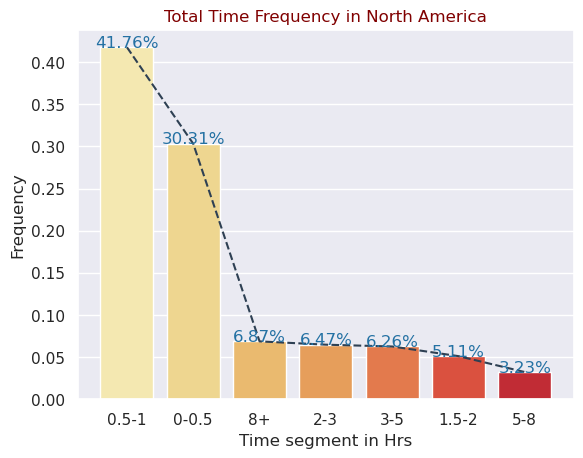

In [15]:
df_na = time_frequency(df_diet_type,'North America')

<div class="alert alert-warning" role="alert">
    <b>What is the percentage of recipes that come under each time group ?</b>
    <ul>
        <li>Most of the recipes comes under 1 hour and least are over 5-8 hours</li>
    </ul>
</div> 

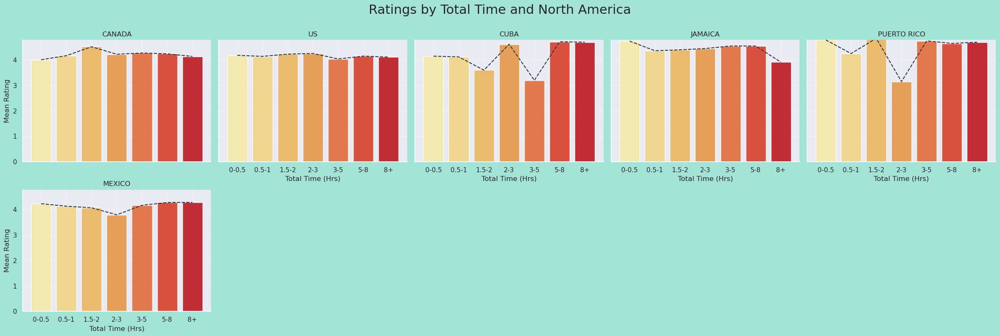

In [16]:
user_interaction_with_time(df_na,'North America',5)

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>On average recipes which takes 3-5 hrs drawing most interaction by the user except US and Mexico those are engaging under 3 hrs of cook time . </li>
    </ul>
</div> 

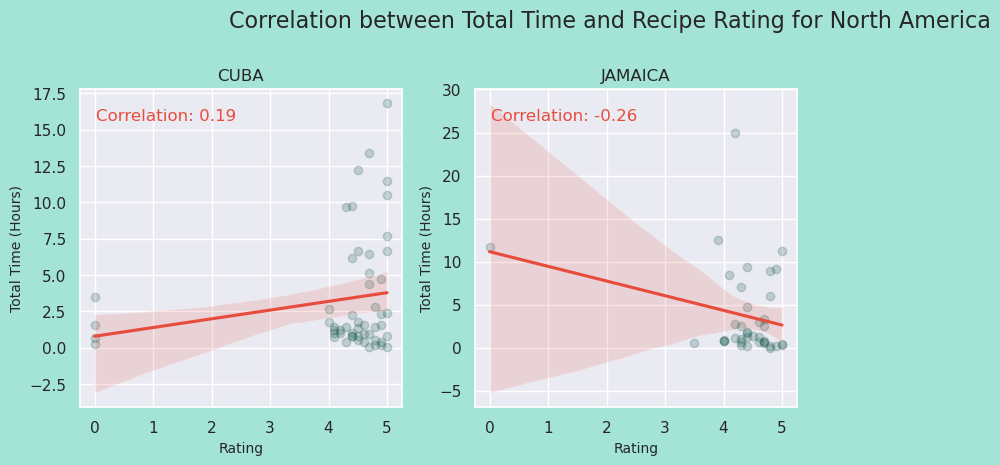

In [17]:
plot_correlation(df_na,'North America',(12,8))

<div class="alert alert-warning" role="alert">
    <b>How does rating column for each country depend on total cook time?</b>
    <ul>
        <li>Jamaica has highest negetive and Cuba has highest positive correlation between rating and time requirement of recipes.</li>
    </ul>
</div> 

<h3 style="text-align:center;background-color:#2980B9; color:white" >1.2. United States of America :</h3>

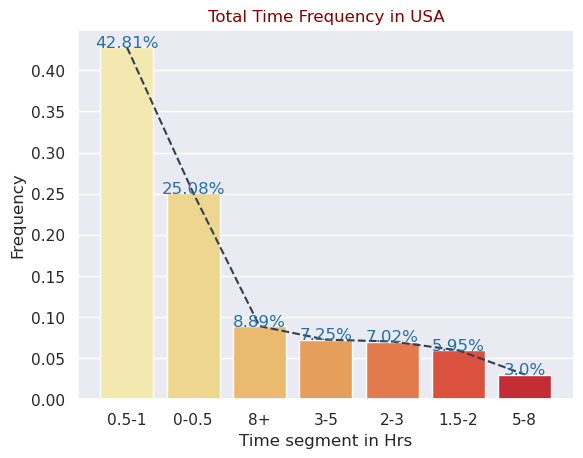

In [18]:
time_frequency(df_State,'USA')

<div class="alert alert-warning" role="alert">
    <b>What is the percentage of recipes that come under each time group ?</b>
    <ul>
        <li>Most of the recipes comes under 1 hour and least are between 5-8 hours</li>
    </ul>
</div> 

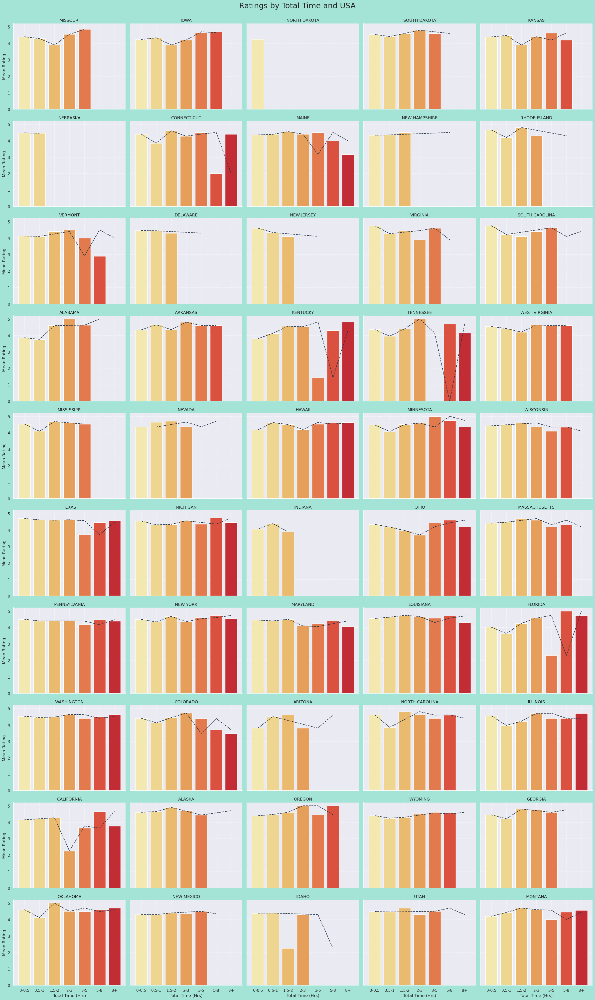

In [19]:
user_interaction_with_time(df_State,'USA',5)

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>On average recipes which takes 2-3 hrs drawing most interaction by the user except Oklahoma(8+) and NY, Michigan those are engaging 5-8 hrs of cook time . </li>
    </ul>
</div> 

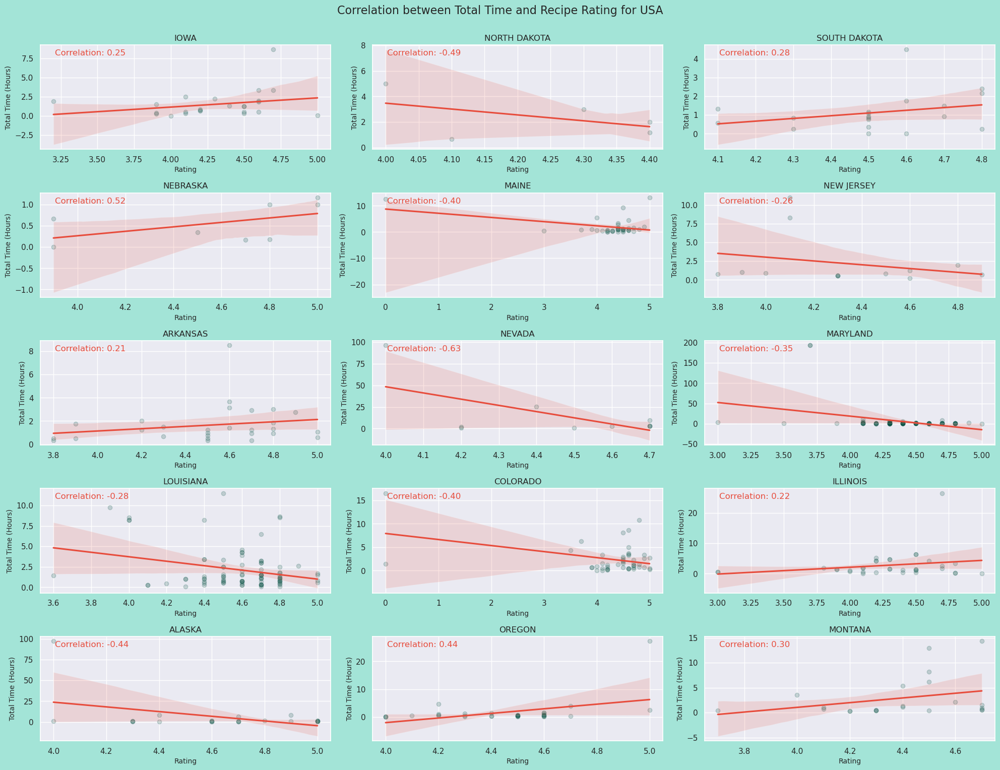

In [20]:
plot_correlation(df_State,'USA',(20,50))

<div class="alert alert-warning" role="alert">
    <b>How does rating column for each states depend on total cook time?</b>
    <ul>
        <li>Nevada has highest negetive and Nebraska has highest positive correlation between rating and time requirement of recipes.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >2. South America :</h2>

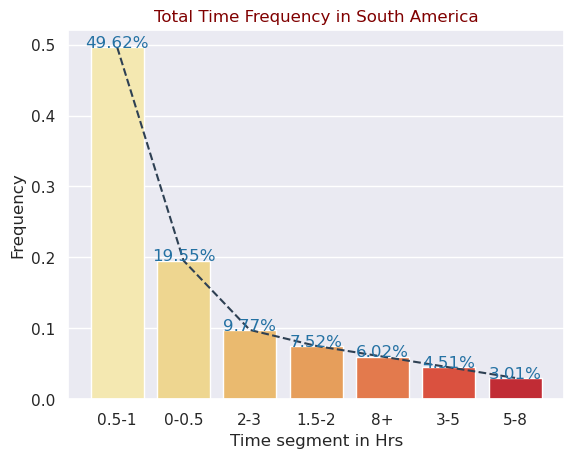

In [21]:
df_sa = time_frequency(df_diet_type,'South America')

<div class="alert alert-warning" role="alert">
    <b>What is the percentage of recipes that come under each time group ?</b>
    <ul>
        <li>Most of the recipes comes under 1 hour and least are between 5-8 hours</li>
    </ul>
</div> 

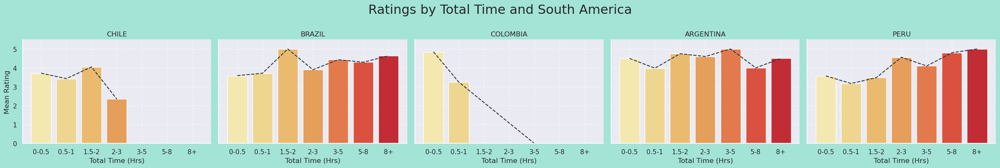

In [22]:
user_interaction_with_time(df_sa,'South America')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>On average recipes which takes under 3 hrs drawing most interaction by the user except Peru(5-8 hrs) of cook time . The above plot shows the subplots for total time vs rating for countries in South America. For Chile, the max total cook time was found when time is less than 1 hour. For Brazil, the max total cook time was found when time is between 3-4 and 6-7 hours. For Columbia, the max total cook time was found when time is between 1-2 hours. For Argentina, the max total cook time was found when time is between 3-4. For Peru, the max total cook time was found when time is between 5-6 hours. For Brazil, the max total cook time was found when time is between 3-4 and 6-7 hours.</li>
    </ul>
</div> 

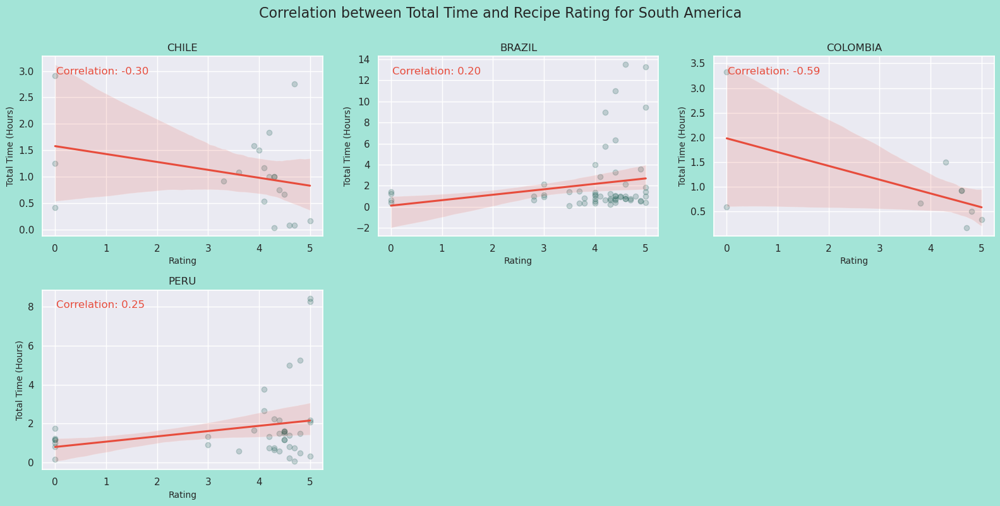

In [23]:
plot_correlation(df_sa,'South America',(16,8))

<div class="alert alert-warning" role="alert">
    <b>How does rating column for each country in South America depend on total cook time?</b>
    <ul>
        <li>Colombia has highest negetive and Peru has highest positive correlation between rating and time requirement of recipes.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >3. Africa :</h2>

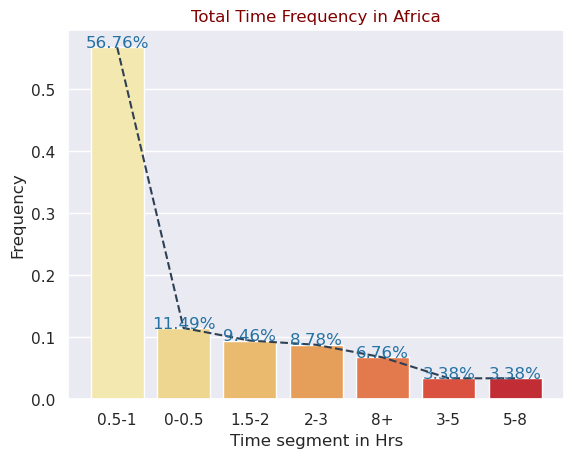

In [24]:
df_africa = time_frequency(df_diet_type,'Africa')

<div class="alert alert-warning" role="alert">
    <b>What is the percentage of recipes that come under each time group ?</b>
    <ul>
        <li>Most of the recipes comes under 1 hour and least are between 5-8 hours</li>
    </ul>
</div> 

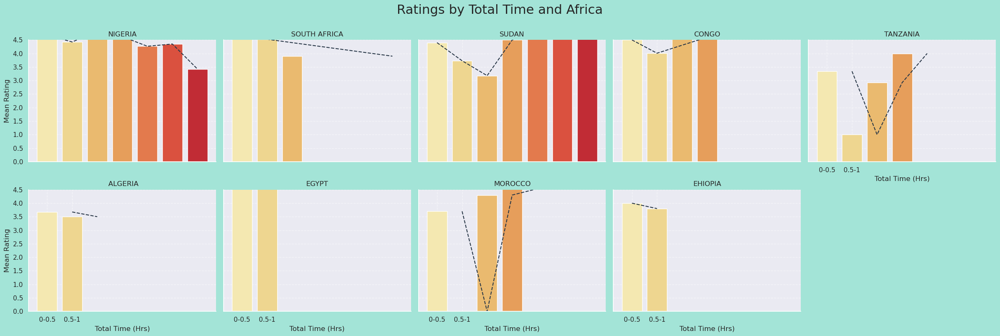

In [25]:
user_interaction_with_time(df_africa,'Africa')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>On average recipes which takes 2 hrs drawing most interaction by the user except Nigeria those are engaging 2-5 hrs of cook time. The above plot shows the subplots of total cook time vs rating for all countries in Africa. For Nigeria, the maximum rating was found when total cook time was less than 1 hour and 2-3 hours. For South Africa, tthe maximum rating was found when total cook time was less than 1 hour. For Sudan, the maximum rating was found when total cook time was found between 5-6 hours. For Congo, the maximum of total cook time was between 2-3 hours. For Tanzania,the maximum rating was found when total cook time was between 3-4 hours. For Algeria, the maximum rating was found when total cook time was less than 1 hour. For Egypt, the maximum rating was found when total cook time was less than 1 hour. For Morocco, the maximum rating was found when total cook time was less than 1 hour. For Ethiopia, the maximum rating was found when total cook time was less than 1 hour.  </li>
    </ul>
</div> 

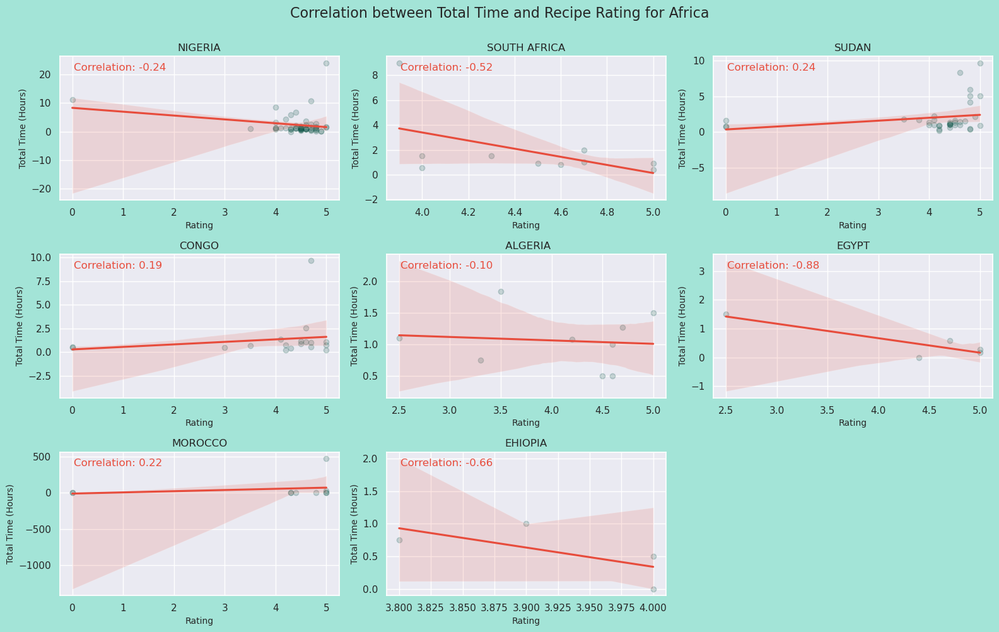

In [26]:
plot_correlation(df_africa,'Africa',)

<div class="alert alert-warning" role="alert">
    <b>How does rating column for each country depend on total cook time?</b>
    <ul>
        <li>Egypt, Ethiopia has highest negetive and Sudan has highest positive correlation between rating and time requirement of recipes.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" > 4. Australia & New Zealand (Oceania) :</h2>

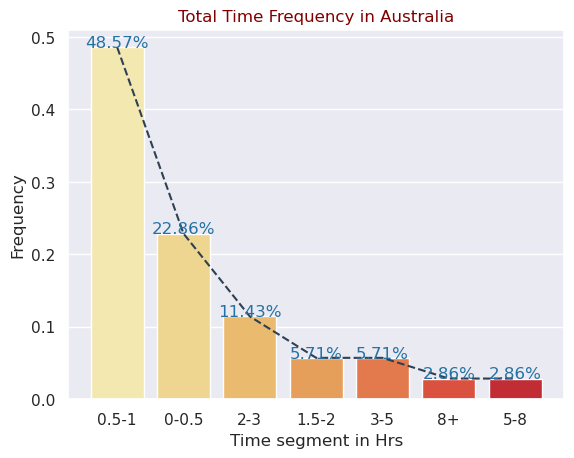

In [27]:
df_australia = time_frequency(df_diet_type,'Australia')

<div class="alert alert-warning" role="alert">
    <b>What is the percentage of recipes that come under each time group ?</b>
    <ul>
        <li>Most of the recipes comes under 1 hour and least are between 5-8 hours</li>
    </ul>
</div> 

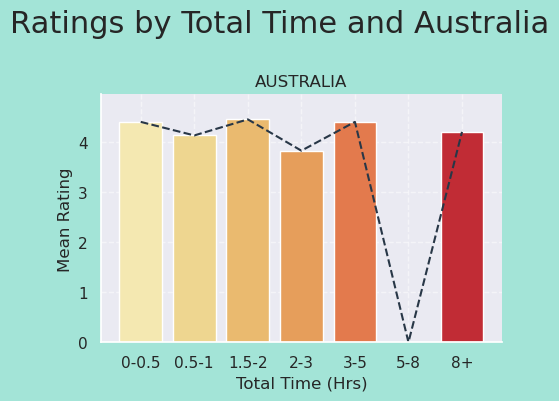

In [28]:
user_interaction_with_time(df_australia,'Australia',1)

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above plot shows the plot for total cook time vs rating for Australia. The maximum rating is found when the cook time was between 1-2 hours. </li>
    </ul>
</div> 

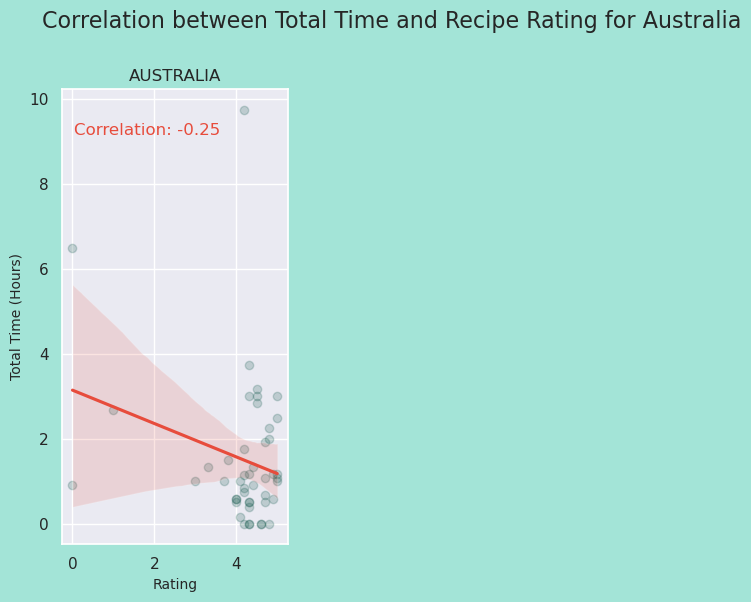

In [29]:
plot_correlation(df_australia,'Australia',(8,6))

<div class="alert alert-warning" role="alert">
    <b>How does rating column for each country depend on total cook time?</b>
    <ul>
        <li>The above plot shows the correlation coefficient for Australia which is around -0.25.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >5. Europe :</h2>

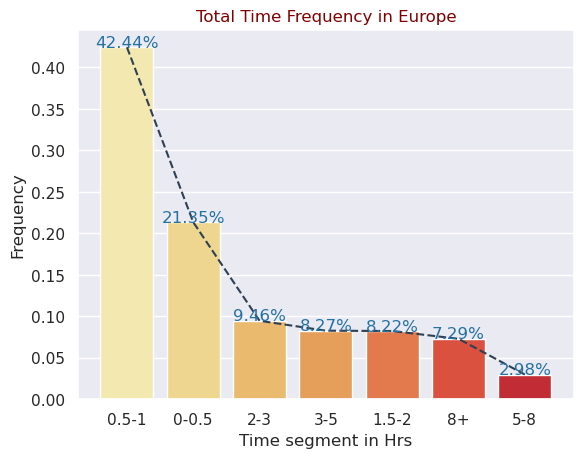

In [30]:
df_europe = time_frequency(df_diet_type,'Europe')

<div class="alert alert-warning" role="alert">
    <b>What is the percentage of recipes that come under each time group ?</b>
    <ul>
        <li>Most of the recipes comes under 1 hour and least are between 5-8 hours</li>
    </ul>
</div> 

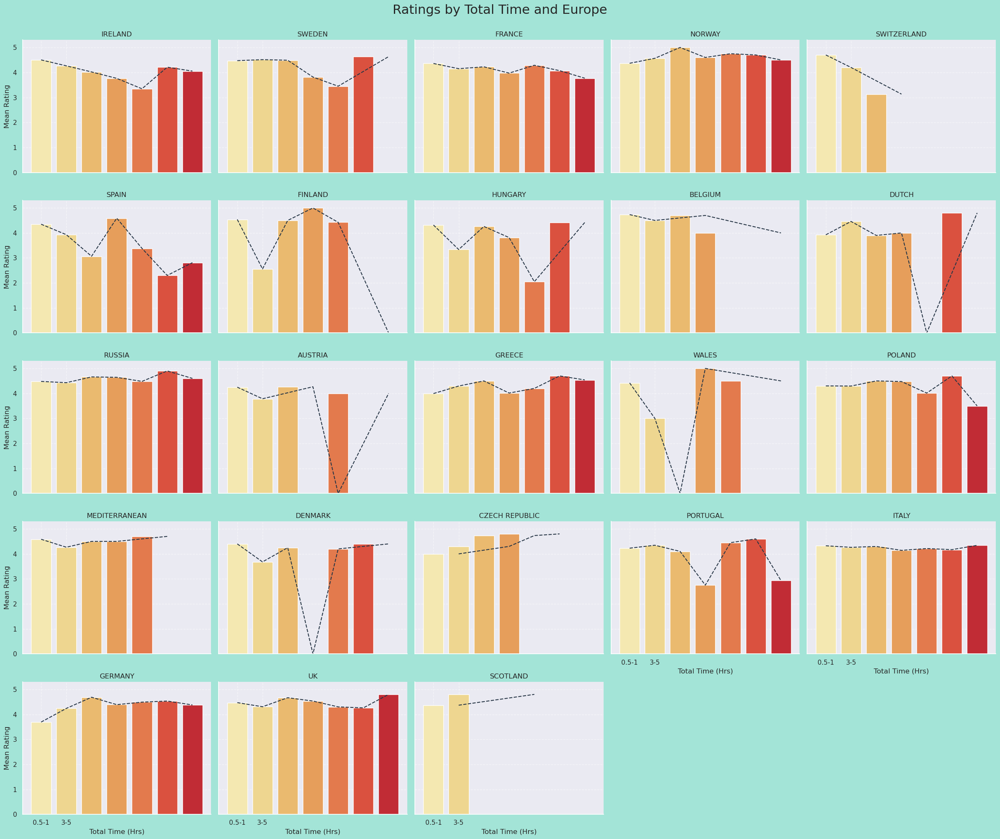

In [31]:
user_interaction_with_time(df_europe,'Europe')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>On average recipes which takes under 5 hrs drawing most interaction by the user except Italy(8+) and Ireland, Greece those are engaging 5-8 hrs of cook time. The above plot shows the subplots of total cook time vas rating for countries in Europe. For Ireland, The max rating was found when the  total cook time was between 7-8 hours. For Sweden, The max rating was found when the total cook time was between 4-5 hours. For France, The max rating was found when the total cook time was between 5-6 hours. For Norway, The max rating was found when the total cook time was between 4-5 hours. For Switzerland, The max rating was found when the total cook time was less than 1 hour and less than 1-2 hours. For Spain, The max rating was found when the total cook time was between 4-5 hours. For Finland, The max rating was found when the total cook time was between 2-3 hours. For Hungary, The max rating was found when the total cook time was between 3-4 hours. For Belgium, The max rating was found when the total cook time was less than 1 hour. For Dutch, The max rating was found when the equal for all time groups. For Russia, The max rating was found when the total cook time was between 5-6 hours. For Austria, The max rating was found when the total cook time was less than 1 hour. For Greece, The max rating was found when the total cook time was between 5-6 hours and 7-8 hours. For Wales, The max rating was found when the total cook time was between 2-3 hours. For Poland, The max rating was found when the total cook time was between 6-7 hours. For Mediterranean recipes, The max rating was found when the total cook time was between 5-6 hours. For Denmark, The max rating was found when the total cook time was between 3-4 hours. For Czech Republic, The max rating was found when the total cook time was between 4-5 hours. For Portugese recipes, The max rating was found when the total cook time was between 3-4 hours. For Italy, The max rating was found when the total cook time was between 5-6 hours. For Germany, The max rating was found when the total cook time was between 5-6 and 7-8 hours. For Uk, The max rating was found when the total cook time was between 2-3 hours. For Scotland, The max rating was found when the total cook time was between 4-5 hours. We see that for most of the countries as the total is increasing the rating ia also max for countries in Europe. </li>
    </ul>
</div> 

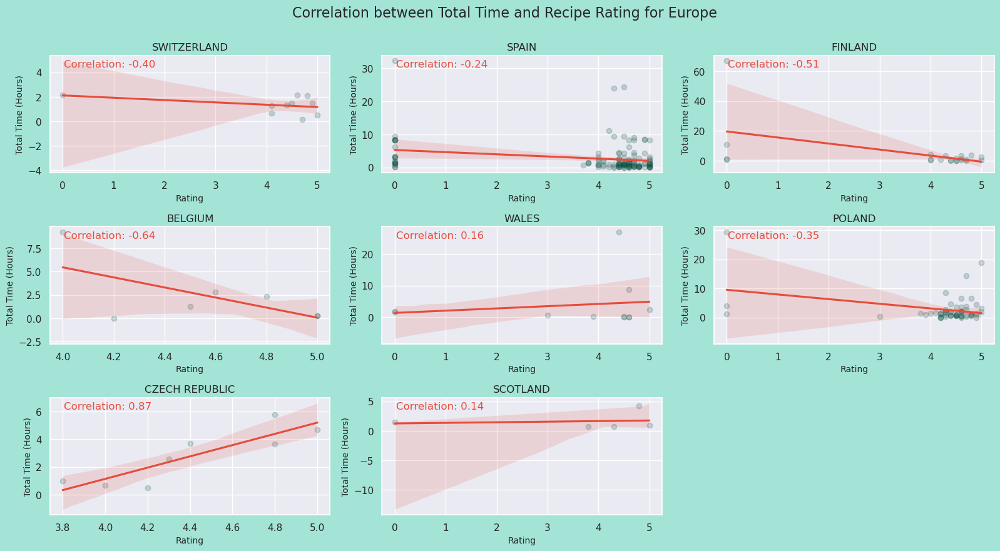

In [32]:
plot_correlation(df_europe,'Europe',(16,22))

<div class="alert alert-warning" role="alert">
    <b>How does rating column for each country depend on total cook time?</b>
    <ul>
        <li>Belgium has highest negetive and Czech Republic has highest positive correlation between rating and time requirement of recipes.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >6. Asia :</h2>

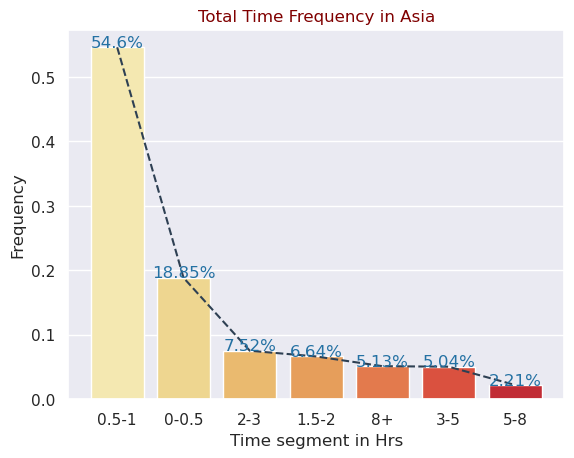

In [33]:
df_asia = time_frequency(df_diet_type,'Asia')

<div class="alert alert-warning" role="alert">
    <b>What is the percentage of recipes that come under each time group ?</b>
    <ul>
        <li>Most of the recipes comes under 1 hour and least are between 5-8 hours</li>
    </ul>
</div> 

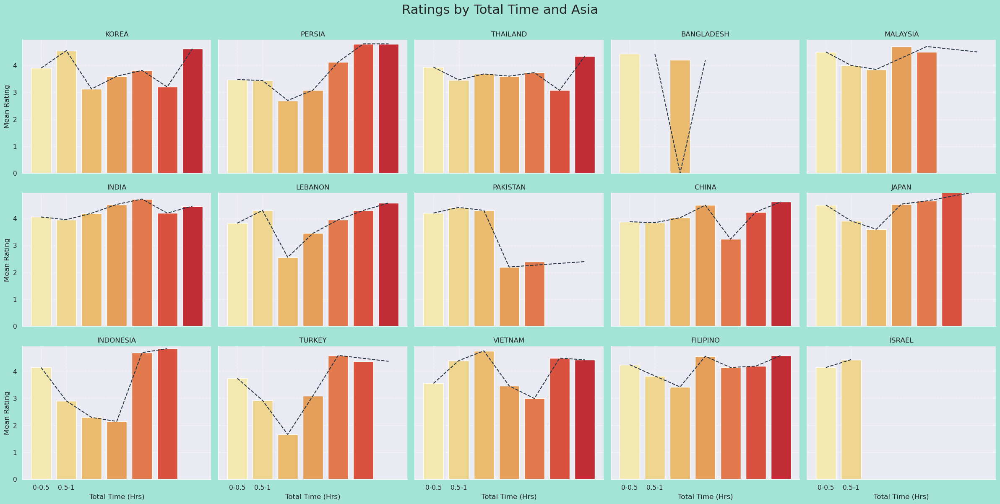

In [34]:
user_interaction_with_time(df_asia,'Asia',5)

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>On average recipes which takes 2-3 hrs drawing most interaction by the user except Oklahoma(8+) and NY, Michigan those are engaging 5-8 hrs of cook time.The above plots shows the subplots of time group vs rating for countries in Asia. For Korea, the maximum rating was found when the total cook time was around 7-8 hours. For Persia, the rating was increasing as the total time is increasing. For Thialand, the maximum rating was found between 4-5 hours. For Bangladesh, the max rating was found when time was less than 1 hour and 2-3 hours. For Malaysia, we see that the max rating was found when was between 2-3 and 4-5 hours. For India, we see that the max rating was found when was between 3-4 and 4-5 hours. For Lenonon, we observe that as total time increses rating is also increasing. For Pakistan, the max rating is found when total time is less than 1 hour, 1-2 hours and 4-5 hours. For China, the max rating was found when total time was 2-3 and 5-6 hours. For China, the max rating was found when total time was 2-3 and 3-4 hours. For China, the max rating was found when total time was 6-7 hours. For China, the max rating was found when total time was 3-4 hours. For Turkey, the max rating was found when total time was 6-7 hours. For Vietnam, the max rating was found when total time was 4-5 and 5-6 hours. For Filipino, the max rating was found when total time was 2-3 ane 6-7 hours. For Israel, the max rating was found when total time was less than 1 hour and all recipes from Israel ahve total cook time less than 1 hour.</li>
    </ul>
</div> 

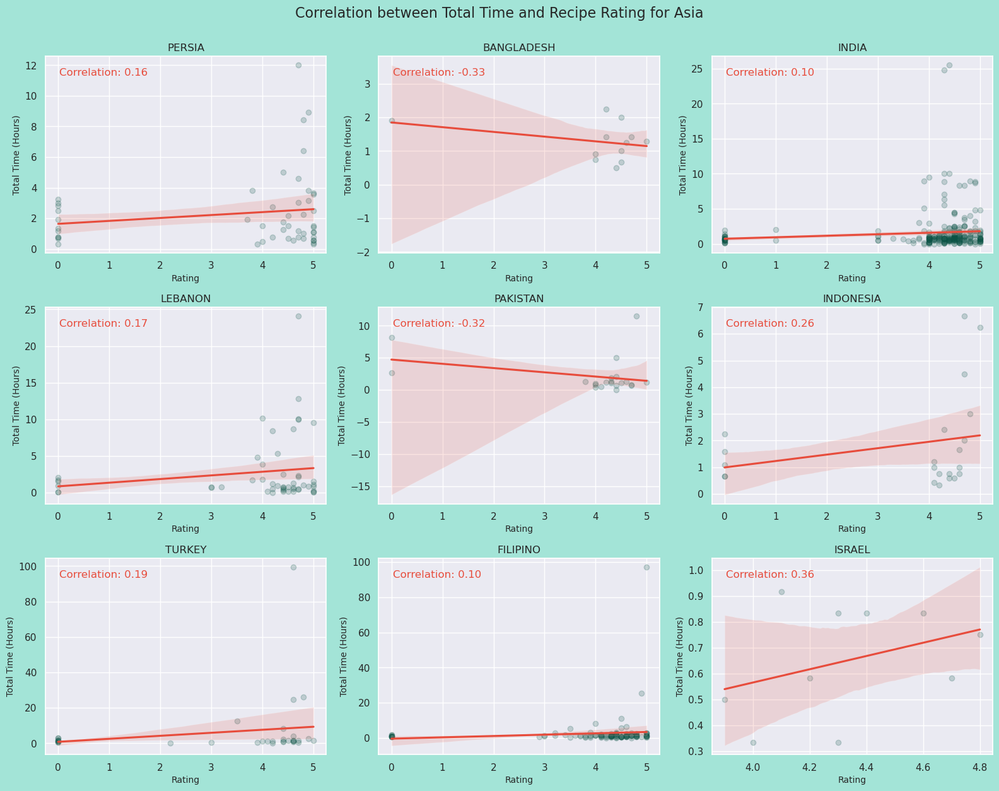

In [35]:
plot_correlation(df_asia,'Asia',(16,20))

<div class="alert alert-warning" role="alert">
    <b>How does rating column for each country depend on total cook time?</b>
    <ul>
        <li>Bangladesh has highest negetive and Israel has highest positive correlation between rating and time requirement of recipes.</li>
    </ul>
</div> 

<h1 style="text-align:center;background-color:#EC7063; color:white" >How the Nutrition Value of a Recipe Distributed across the Countries/States ? </h1>

<h2 style="text-align:left;background-color:#48C9B0; color:white" >Defining Functions</h2>

In [36]:
# Function to plot nutrition
def plot_nutrition(input_df,list_cols,continent=None):
    """
    Function to plot nutrition for each country state.

    Arguments:

    input_df: pandas DataFrame containing the data to plot
    list_cols : liat of the columns
    continent : Continent or Country
    Returns:

    None
    """
    if continent != 'USA':
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
#         fig.subplots_adjust(hspace=1)  
    else:
        fig, axes = plt.subplots(4, 2, figsize=(20, 10))
        fig.subplots_adjust(hspace=10)  
    fig.set_facecolor('#A3E4D7')
    ax = axes.ravel()
    for i in range(len(list_cols)):
        if continent != 'USA':
            colors = sns.color_palette('YlGnBu', n_colors=len(input_df.Country_State.unique()))
            grouped = input_df.groupby("Country_State")[list_cols[i]].mean()
            df_grouped = pd.DataFrame(grouped.reset_index(name=f"AVG_{list_cols[i]}"))
            df_grouped = df_grouped.sort_values(by=f"AVG_{list_cols[i]}")
            sns.barplot(y='Country_State', x=f"AVG_{list_cols[i]}", data=df_grouped, ax=ax[i], palette=colors,orient='h')
            ax[i].set_yticklabels(df_grouped['Country_State'], rotation=0, fontsize=12)
        else:
            colors = sns.color_palette('YlGnBu_r', n_colors=len(input_df.State.unique())//4)
            grouped = input_df.groupby("State")[list_cols[i]].mean()
            df_grouped = pd.DataFrame(grouped.reset_index(name=f"AVG_{list_cols[i]}"))
            df_grouped = df_grouped.sort_values(by=f"AVG_{list_cols[i]}",ascending=False)[:10]
            sns.barplot(y='State', x=f"AVG_{list_cols[i]}", data=df_grouped, ax=ax[i], palette=colors,orient='h')
            ax[i].set_yticklabels(df_grouped['State'], rotation=0)
    plt.suptitle(f'Distribution of Nutrific values & User Interaction in {continent} ',fontsize=20, color='k')
    fig.tight_layout()
    fig.savefig(f'Distribution of Nutrific values & User Interaction in {continent} ',dpi=200)
    fig.show()

In [37]:
list_cols = df_diet_type.columns[-14:-6]

<h2 style="text-align:center;background-color:#2980B9; color:white" >1. North America :</h2>

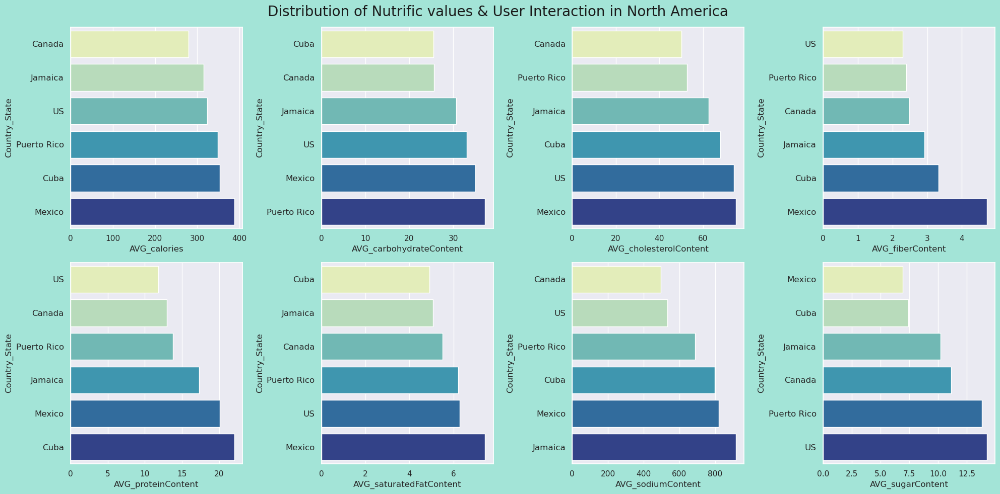

In [38]:
plot_nutrition(df_na,list_cols,'North America')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>From the above subplots, we observe that Canada, US and Mexico recipes have the highest ratings among the countries in North America. The average calories is highest for Mexican recipes. The carbohydrate content is higest for Puerto rico recipes. The cholesterol content is more for US and Mexico recipes. The fibre content is more for Mexican recipes. The protein content is more for Cuba recipes. The Saturated fat content is more for Mexican recipes. The sodium content is more for Jamaican recipes.</li>
    </ul>
</div> 

<h3 style="text-align:center;background-color:#2980B9; color:white" >1.2. United States of America :</h3>

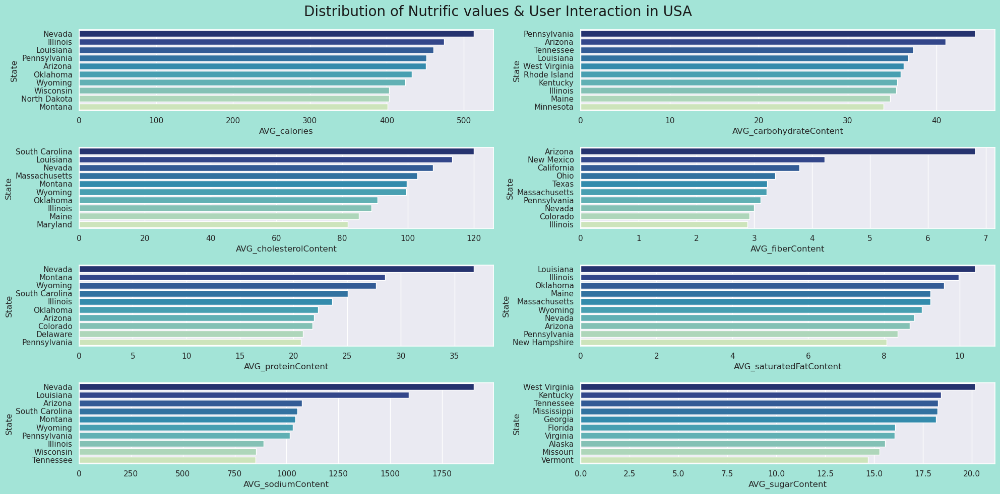

In [39]:
plot_nutrition(df_State,list_cols,continent='USA')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>Arizona(fibre), Nevada(sodium, protein), pennsylvenia(carbs), South Carolina(Cholesterol), lousiana (saturated fat), West virginia(Sugar) has highest nutrific value amomng the US states.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >2. South America :</h2>

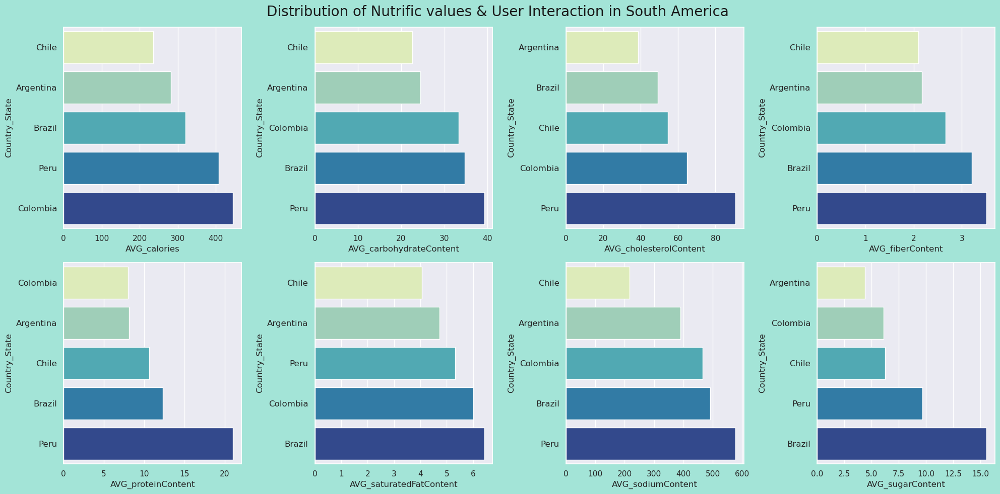

In [40]:
plot_nutrition(df_sa,list_cols,'South America')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above shows the average of nutrition values for South America. From the above subplots, we observe that Brazilian recipes have the highest ratings among the countries in Europe. The average calories is highest for columbian recipes. The carbohydrate comtent is higest for peru recipes. The cholesterol content is more for peruvian recipes. The fibre content is more for peruvian recipes. The protein content is more for peruvian recipes. The Saturated fat content is more for Brazilian recipes. The sodium content is more for Peruvian recipes.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >3. Africa :</h2>

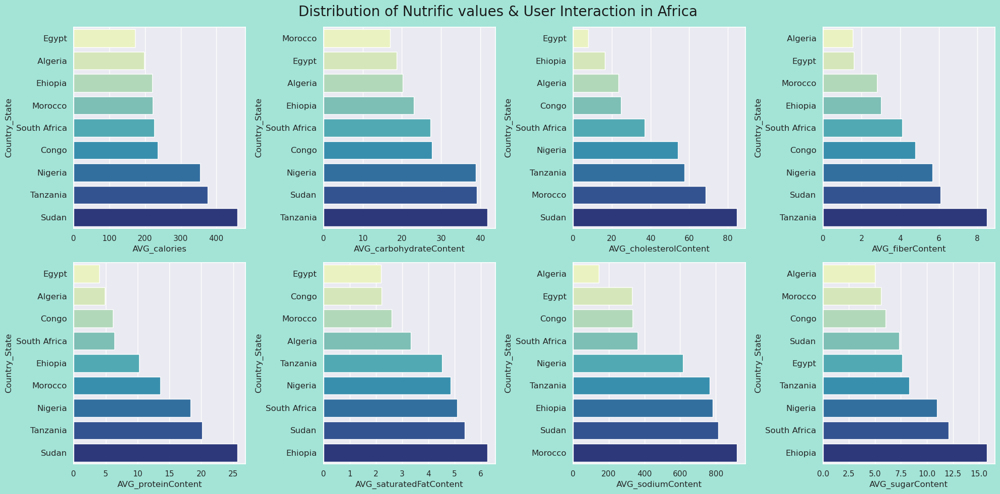

In [41]:
plot_nutrition(df_africa,list_cols,'Africa')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above shows the average of nutrition values for Africa. From the above subplots, we observe that Nigerian recipes have the highest ratings among the countries in Europe. The average calories is highest for Sudan recipes. The carbohydrate content is higest for Tanzania recipes. The cholesterol content is more for Sudan recipes. The fibre content is more for Tanzania recipes. The protein content is more for Sudan recipes. The Saturated fat content is more for Ethiopia recipes. The sodium content is more for Morocco recipes.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" > 4. Australia & New Zealand (Oceania) :</h2>

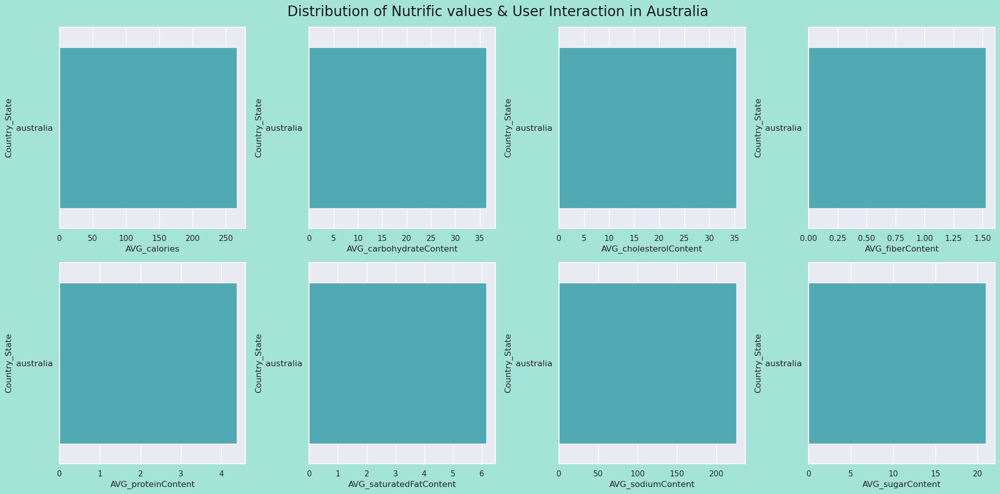

In [42]:
plot_nutrition(df_australia,list_cols,'Australia')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above plots shows the nutritional values for Australia. The average rating for Australia is 50. The average calories for Australia is 250.The average cabohydrates for Australia is 40. The average Cholestrerol for Australia is 40. The average fiber for Australia is 1.50. The average protein for Australia is 4.50. The average saturated fat for Australia is 6. The average sodium for Australia is 250. 
</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >5. Europe :</h2>

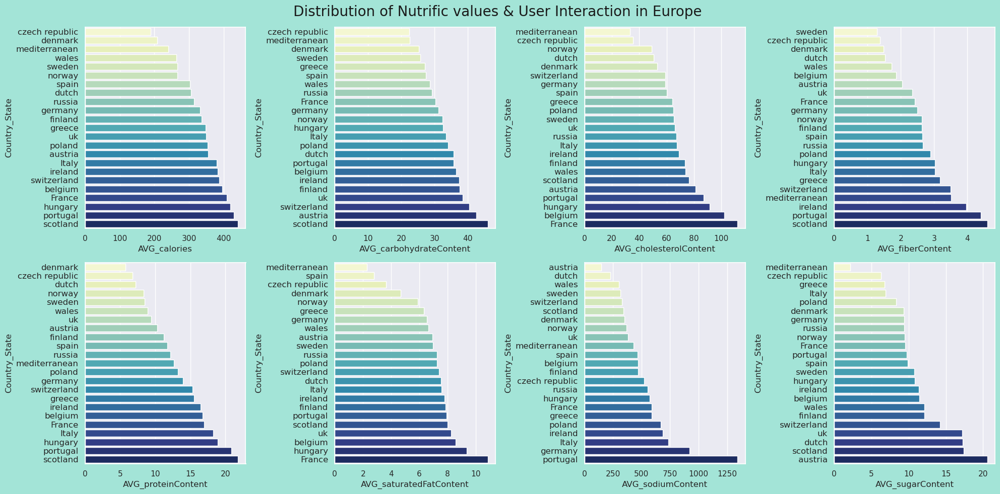

In [43]:
plot_nutrition(df_europe,list_cols,'Europe')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above shows the average of nutrition values for Europe. From the above subplots, we observe that French recipes have the highest ratings among the countries in Europe. The average calories is highest for Scottish recipes. The carbohydrate comtent is higest for Scottish recipes. The cholesterol content is more for French recipes. The fibre content is more for Scottish recipes. The protein content is more for scottish recipes. The Saturated fat content is more for French recipes. The sodium content is more for Portugese recipes. </li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >6. Asia :</h2>

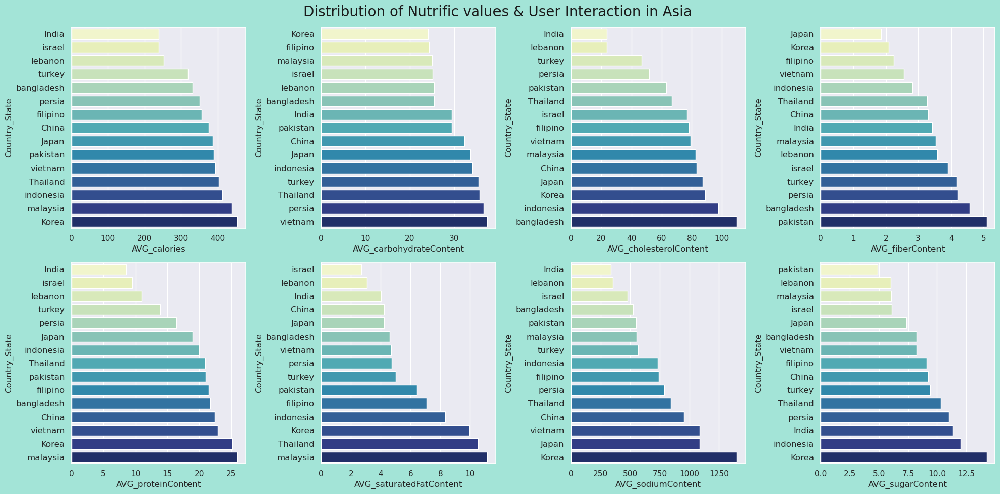

In [44]:
plot_nutrition(df_asia,list_cols,'Asia')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>From the above subplots, we observe that Indian, Chinese and Thialand recipes have the highest ratings among the countries in Asia. The average calories is highest for Korean recipes. The carbohydrate comtent is higest for vietnamese recipes. The cholesterol content is more for bangladeshi recipes. The fibre content is more for Pakistani recipes. The protein content is more for malaysian recipes. The Saturated fat content is more for Malayasian recipes. The sodium content is more for Korean recipes.</li>
    </ul>
</div> 

<h1 style="text-align:center;background-color:#EC7063; color:white" >How the Non Veg, Veg, Vegan Recipes are Distributed across the Countries/States ? </h1>

<h2 style="text-align:left;background-color:#48C9B0; color:white" >Defining Functions</h2>

In [45]:
def plot_typeOfDiets(input_df,continent,figsize=(16, 6)):
    """
    Function to plot the count of different types of diets for each country in a given continent

    Args:

    input_df: pandas DataFrame containing data for all countries
    rotation: rotation angle for x-axis labels
    continent: string representing the continent for which to plot the data
    Returns:

    None, but displays a plot of the count of different types of diets for each country in the given continent
    """
    column = 'Country_State'
    if 'State' in list(input_df.columns):
        column = 'State'

    palette = {'vegan': '#8E44AD', 'nveg': '#E74C3C', 'veg': '#239B56'}
    # create a 1x2 subplot
    fig, ax = plt.subplots(1, 2, figsize=figsize)
    fig.set_facecolor('#A3E4D7')
    # first countplot
    sns.countplot(data=input_df, y=column, hue='diet_type', dodge=False, palette=palette, ax=ax[0],orient='h')
    ax[0].set_yticks(range(len(input_df[column].unique())))
    ax[0].set_yticklabels(input_df[column].unique(), fontsize=10)
    ax[0].set_xscale('log')
    ax[0].set_ylabel('Countries/Counties', fontsize=12)
    ax[0].set_xlabel('Count (in log scale)', fontsize=12)
    ax[0].set_title(f"Count of diet types for {continent}", fontsize=16)
    ax[0].legend(title='diet_type', fontsize=12)

    # second countplot
    sns.countplot(data=input_df, y=column, hue='diet_type', dodge=True, palette=palette, ax=ax[1],orient='h')
    ax[1].set_yticks(range(len(input_df[column].unique())))
    ax[1].set_yticklabels(input_df[column].unique(), fontsize=10)
    ax[1].set_xscale('log')
    ax[1].set_ylabel('Countries/Counties', fontsize=12)
    ax[1].set_xlabel('Count (in log scale)', fontsize=12)
    ax[1].set_title(f"Count of diet types for {continent} (dodged)", fontsize=16)
    ax[1].legend(title='diet_type', fontsize=12)

    # adjust spacing between subplots
    fig.tight_layout()
    fig.savefig(f"Count of diet types for {continent}",dpi=200)
    # show the plot
    plt.show()

In [46]:
def reframe_angles_degrees(angles):
    reframed_angles = []
    for angle in angles:
        while angle < 0:
            angle += 360
        while angle >= 360:
            angle -= 360
        reframed_angles.append(angle)
    return reframed_angles

In [47]:
def circularPlot_typeOfDiets(input_df):
    column = 'Country_State'
    if 'State' in list(input_df.columns):
        column = 'State'
    counts = input_df.groupby(column)['diet_type'].value_counts().unstack().fillna(0)
    categories = counts.columns.tolist()
    labels = counts.index.tolist()
    # set up plot
    fig, ax = plt.subplots(subplot_kw=dict(polar=True), figsize=(10, 8))

    # plot bars
    width = 2*np.pi / len(labels)
    angles = [np.pi/2 - i*width for i in range(len(labels))] 
    colors = ['#E74C3C', '#239B56', '#8E44AD']
    for i, category in enumerate(categories):
        bars = ax.bar(angles, np.log10(counts[category]), width=width, bottom=0.0, color=colors[i], alpha=0.6, label=category)
    # add labels
    angles_deg = [angle * 180 / np.pi for angle in angles]
    angles_deg = reframe_angles_degrees(angles_deg)
    ax.set_thetagrids(angles_deg, labels)
    ax.set_theta_offset(np.pi/2)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)
    ax.set_title('Circular Bar Plot', fontsize=16, y=1.1)
    ax.legend()

    plt.show()

<h2 style="text-align:center;background-color:#2980B9; color:white" >1. North America :</h2>

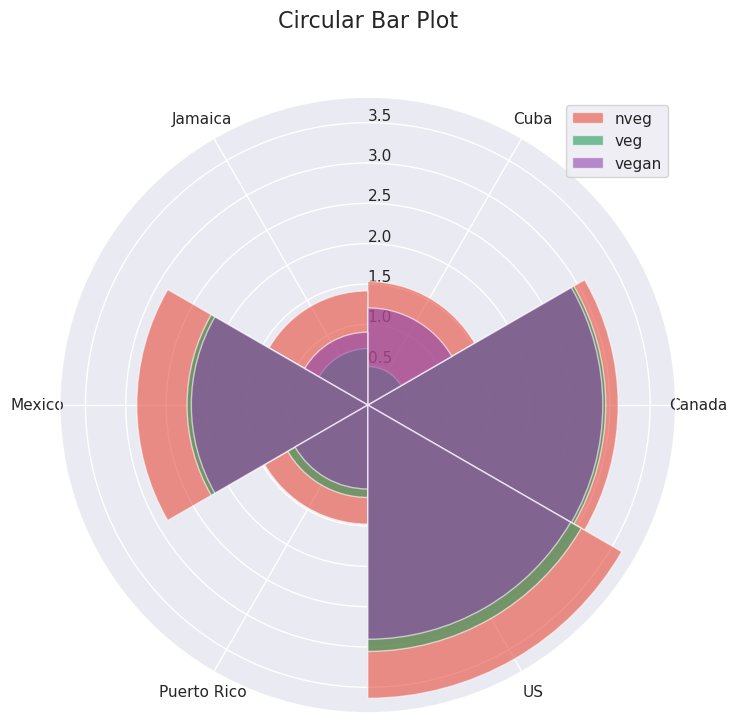

In [48]:
circularPlot_typeOfDiets(df_na)

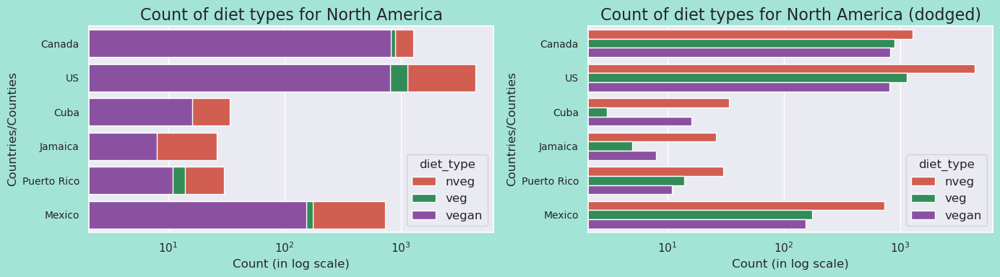

In [49]:
plot_typeOfDiets(df_na, 'North America',(14,4))

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above plots show the count or veg, non-veg, vegan categories for countries in North America. we see that US recipes have more non veg dishes compared to other countries in North America. US and Canada recipes are more like veg and vegan dishes.
</li>
    </ul>
</div>


<h3 style="text-align:center;background-color:#2980B9; color:white" >1.2. United States of America :</h3>

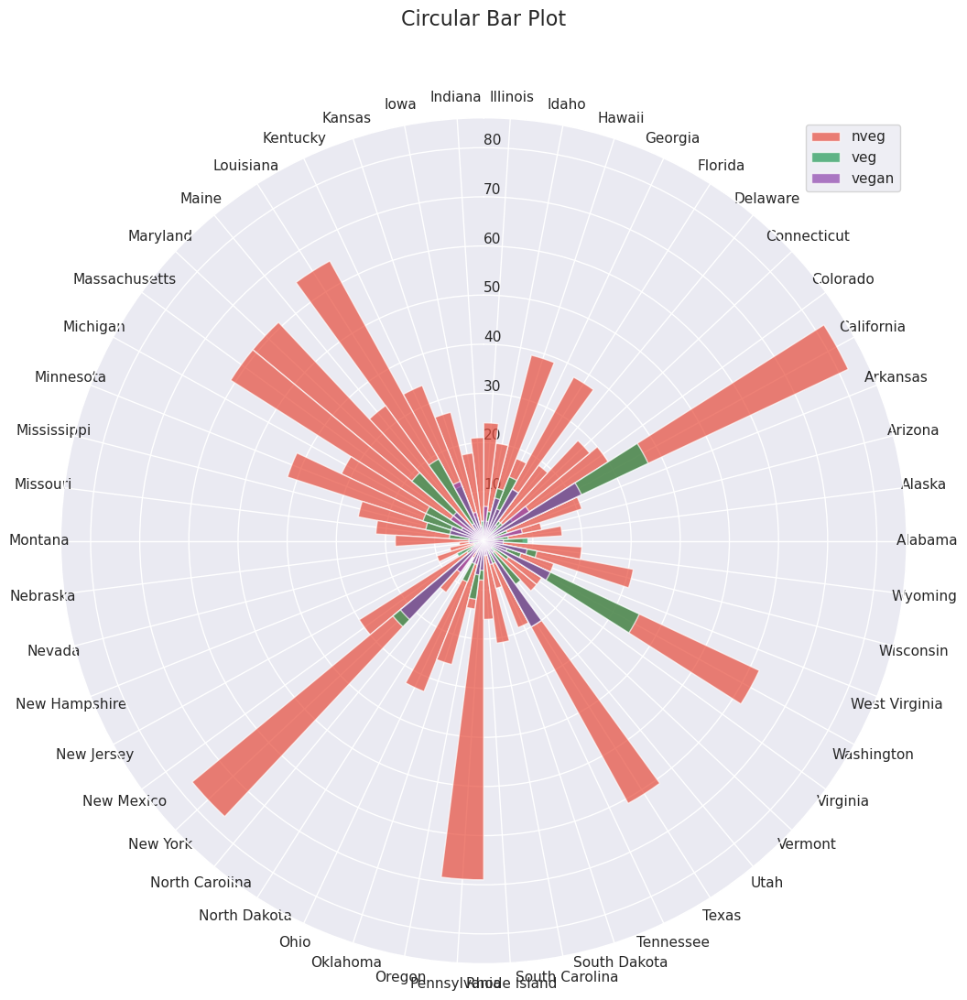

In [50]:
# circularPlot_typeOfDiets(df_State)
counts = df_State.groupby('State')['diet_type'].value_counts().unstack().fillna(0)
categories = counts.columns.tolist()
labels = counts.index.tolist()

# set up plot
fig, ax = plt.subplots(subplot_kw=dict(polar=True), figsize=(14, 12))

# plot bars
width = 2*np.pi / len(labels)
angles = [np.pi/2 - i*width for i in range(len(labels))] 
colors = ['#E74C3C', '#239B56', '#8E44AD']
for i, category in enumerate(categories):
    bars = ax.bar(angles, counts[category], width=width, bottom=0.0, color=colors[i], alpha=0.7, label=category)
angles_deg = [angle * 180 / np.pi for angle in angles]
angles_deg = reframe_angles_degrees(angles_deg)
ax.set_thetagrids(angles_deg, labels)
ax.set_theta_offset(np.pi/2)
ax.set_theta_direction(-1)
ax.set_rlabel_position(0)
ax.set_title('Circular Bar Plot', fontsize=16, y=1.1)
ax.legend()
plt.show()

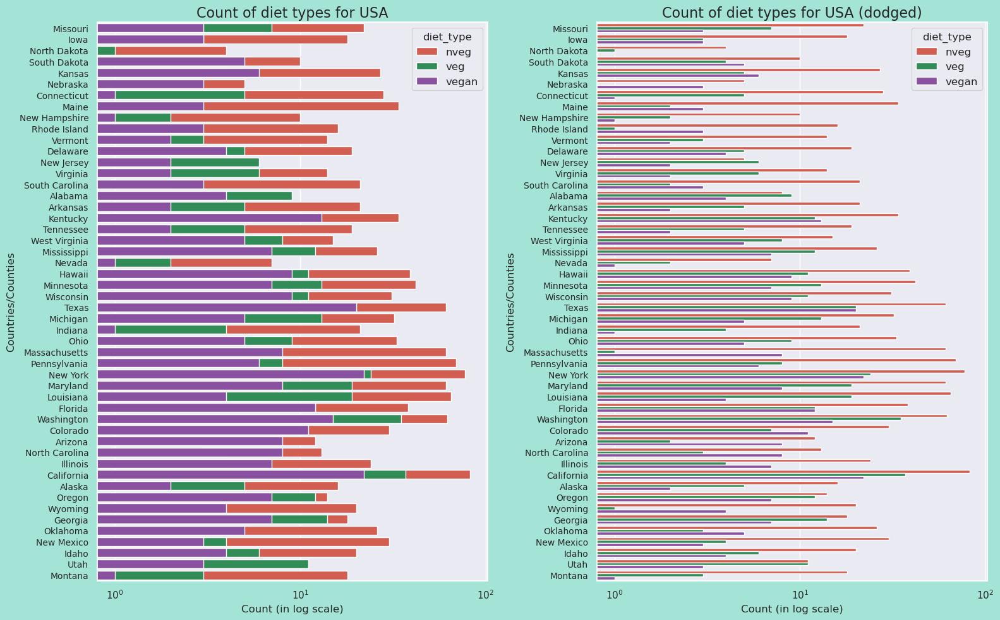

In [51]:
plot_typeOfDiets(df_State, 'USA',(16,10))

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>Non veg recipes are dominant in USA except for Utah and Delware.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >2. South America :</h2>

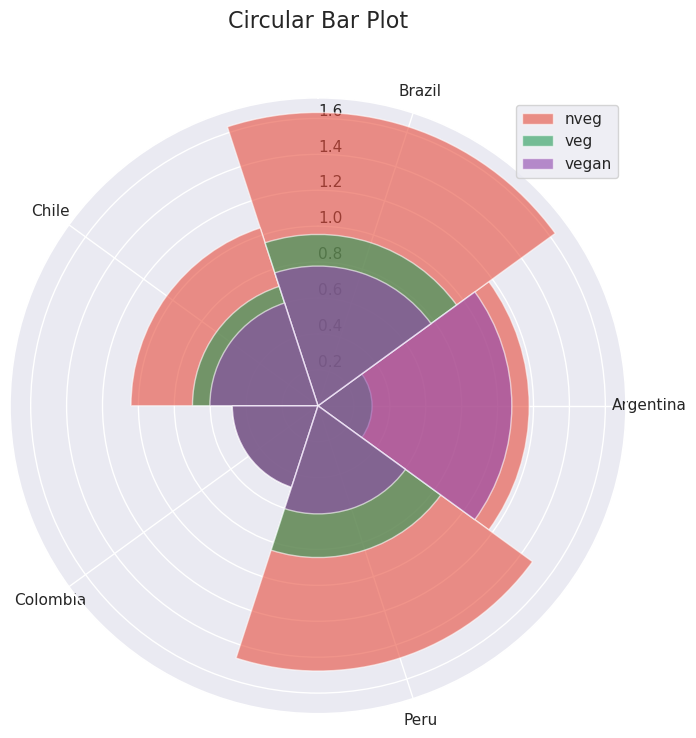

In [52]:
circularPlot_typeOfDiets(df_sa)

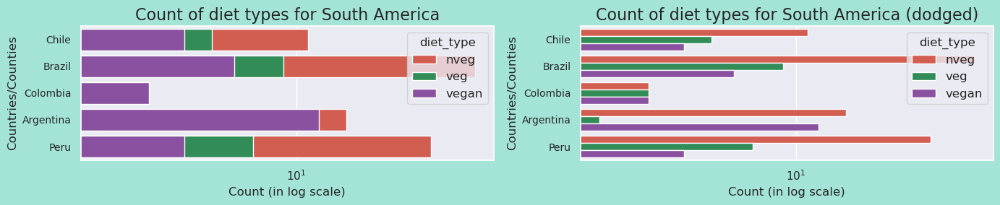

In [53]:
plot_typeOfDiets(df_sa, 'South America',(14,3))

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above plots show the count or veg, non-veg, vegan categories for countries in South America. we see that Brazilian recipes have more non veg and veg dishes. Argentinian recipes have more vegan dishes.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >3. Africa :</h2>

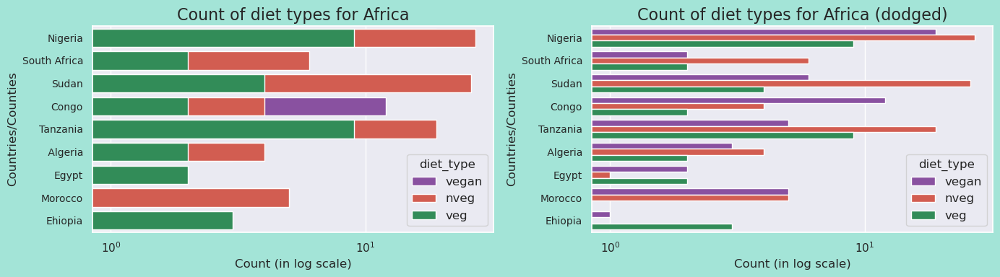

In [54]:
plot_typeOfDiets(df_africa,'Africa',(14,4))

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above plots show the count or veg, non-veg, vegan categories for countries in Africa. we see that Nigerian recipes occupy maximum numbe rof veg, non veg and vegan recipes compared to other countries in Africa.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" > 4. Australia & New Zealand (Oceania) :</h2>

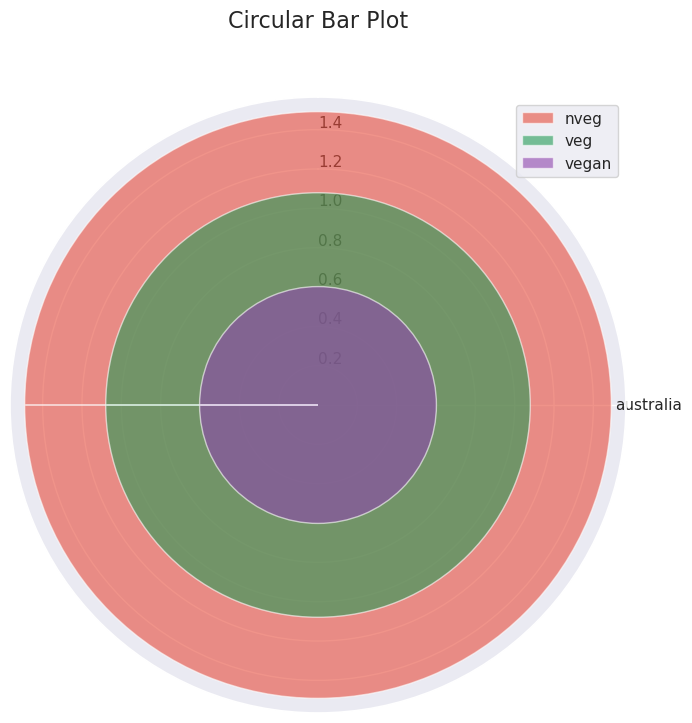

In [55]:
circularPlot_typeOfDiets(df_australia)

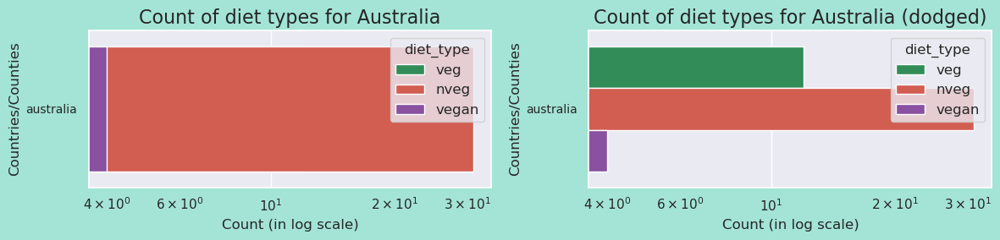

In [56]:
plot_typeOfDiets(df_australia, 'Australia',(12,3))

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The number of non veg recipes for australia is 30, Veg recipes are 12 and vegan recipes are 4. so It has more non veg dishes.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >5. Europe :</h2>

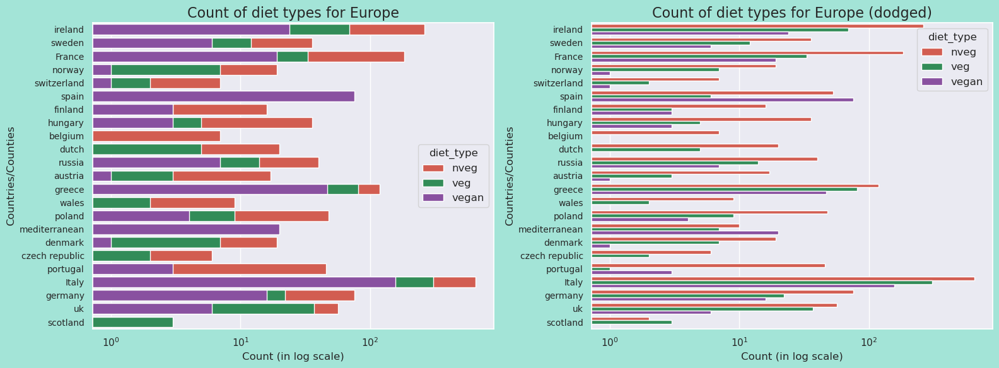

In [57]:
plot_typeOfDiets(df_europe,'Europe')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above plots show the count or veg, non-veg, vegan categories for countries in Europe. we see that Italian recipes have more veg, non veg and vegan dishes.</li>
    </ul>
</div> 

<h2 style="text-align:center;background-color:#2980B9; color:white" >6. Asia :</h2>

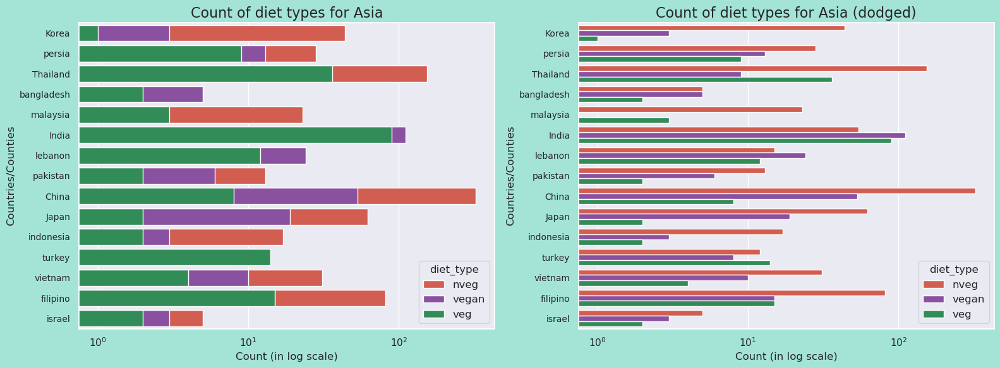

In [58]:
plot_typeOfDiets(df_asia, 'Asia')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The above plots show the count or veg, non-veg, vegan categories for countries in Asia. we see that Chinese recipes have more non veg dishes compared to other countries in Asia. Indian recipes are more like veg and vegan dishes.</li>
    </ul>
</div> 

<h1 style="text-align:center;background-color:#EC7063; color:white" >What is the Relation between No of Steps and No of Ingredients of a Recipe across the Countries/States ? </h1>

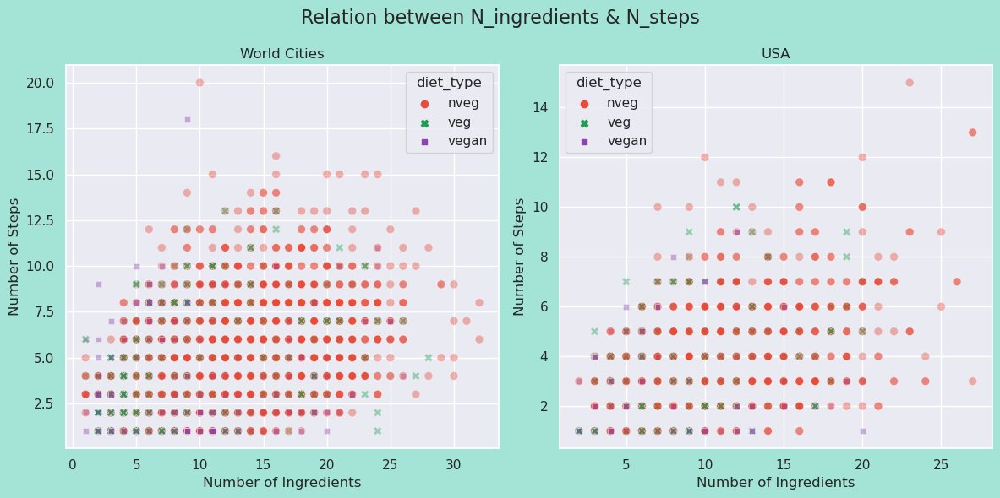

In [59]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 6))
fig.set_facecolor('#A3E4D7')
palette = {'vegan': '#8E44AD', 'nveg': '#E74C3C', 'veg': '#239B56'}
# Create the scatterplot for the world cities data
sns.scatterplot(data=EDA_master_df, x='n_ingredients', y='n_step',hue='diet_type',style='diet_type',legend=True, ax=ax1,
                palette=palette,s=50,alpha=0.4)
ax1.set_xlabel('Number of Ingredients')
ax1.set_ylabel('Number of Steps')
ax1.set_title('World Cities')

# Create the scatterplot for the US state data
sns.scatterplot(data=eda_df_states, x='n_ingredients', y='n_step',hue='diet_type',style='diet_type',legend=True,
                ax=ax2, palette=palette,s=50,alpha=0.4)
ax2.set_xlabel('Number of Ingredients')
ax2.set_ylabel('Number of Steps')
ax2.set_title('USA')
plt.suptitle('Relation between N_ingredients & N_steps',fontsize=16)
plt.tight_layout()
plt.savefig('N ingredients vs N steps.png',dpi=120)
# Show the plot
plt.show()

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>There is no such strong co-relation among them but we can see that with increasing number of ingredients in non veg recipes the no of steps are also incresing</li>
    </ul>
</div> 

<h1 style="text-align:center;background-color:#EC7063; color:white" >What is the Relation between No of Steps and No of Ingredients of a Recipe with Total Cooking Time across the Countries/States ? </h1>

<h2 style="text-align:left;background-color:#48C9B0; color:white" >Defining Functions</h2>

In [60]:
def plot_time_relation(input_df,variable,title):
    """
    Plots a bar graph of the number of steps required for a given cooking time range, for each unique country/state in the input dataframe.

    Args:
    input_df: a pandas dataframe containing cooking data with columns 'Country_State', 'total_time', and 'n_step' (if isState is not True). If isState is True, then the dataframe should have columns 'State', 'total_time', and 'rating'.
    variable: 'n_steps' or 'n_ingredients' or any column
    title: title of the plot 
    Returns:
    A bar graph of the number of steps required for a given cooking time range, for each unique country/state in the input dataframe.
    """
    input_df['time_segment'] = input_df['total_time'].apply(get_hrs)
    column = 'Country_State'
    figsize=(20,30)
    nrows=12
    if 'State' in list(input_df.columns):
        column = 'State'
        figsize = (20,25)
        nrows=10
    # create subplots
    fig, axs = plt.subplots(nrows=nrows, ncols=5, figsize=figsize)
    fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1,top=0.9, wspace=0.4, hspace=0.7)
    fig.set_facecolor('#A3E4D7')
    ax = axs.ravel() 
    colors = sns.color_palette('YlOrRd', n_colors=8)
    for i, country_state in enumerate(input_df[column].unique()):
        # Subset the data for the current country state
        group = input_df[input_df[column] == country_state]

        # Group the data by time segment and calculate the mean rating for each segment
        group_agg = group.groupby('time_segment')[variable].mean().reset_index()

        # Plot the mean ratings on the current subplot
        ax[i].bar(group_agg['time_segment'], group_agg[variable],color=colors)
        ax[i].plot(group_agg['time_segment'], group_agg[variable],color = "black",linewidth=1.5,linestyle='dashed')

        ax[i].set_title(country_state.upper(),fontsize=12)
        ax[i].set_xlabel('Total Time (Hours)')
        ax[i].set_ylabel(variable.capitalize())
        ax[i].set_ylim([0, group_agg[variable].max()+0.5])
    if i == 58:
        ax[59].remove()
    plt.suptitle(f'{variable.upper()} Dependency on Total Time across {title}',fontsize=22,y=1)
    fig.tight_layout()
    fig.savefig(f'{variable.upper()} Dependency on Total Time across {title}.png',dpi=200)
    plt.show()

<h1 style="text-align:center;background-color:#117A65; color:white" >World Countries</h1>

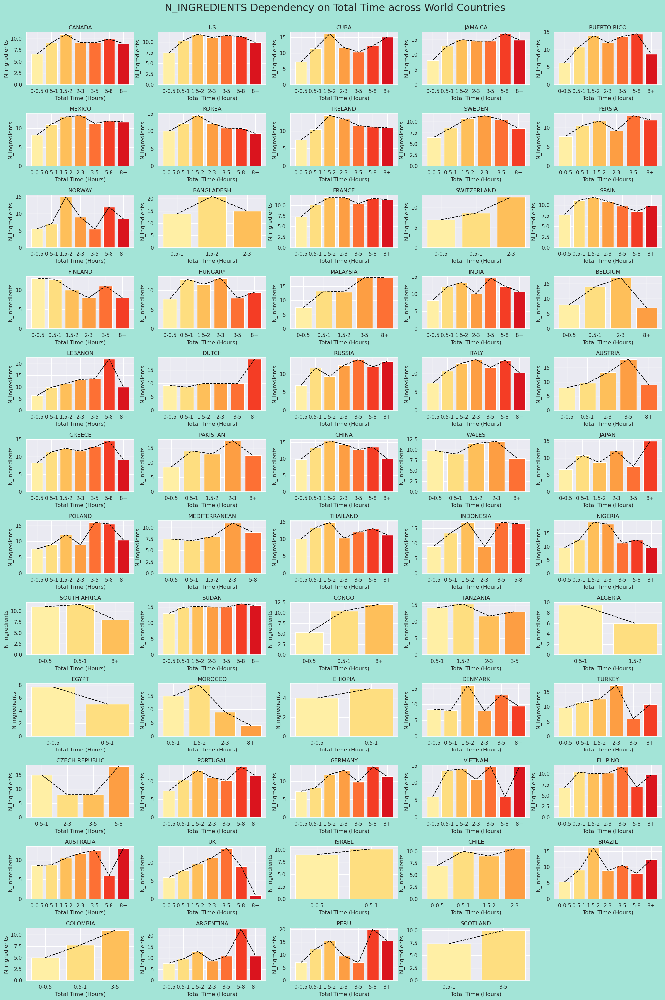

In [61]:
plot_time_relation(EDA_master_df,'n_ingredients','World Countries')

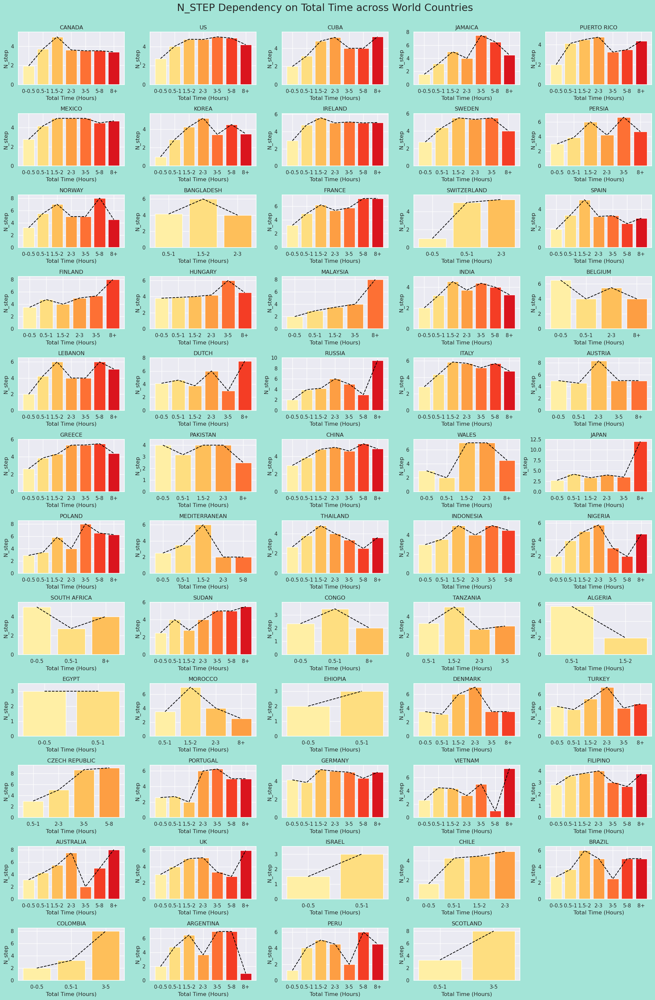

In [62]:
plot_time_relation(EDA_master_df,'n_step','World Countries')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The Above graphs represent no of steps required to prepare a dish vs the total time required to cook the dish including prep time and cooking time but as we can see most of the countries doesn't have exponential growth as no of steps increases.</li>
    </ul>
</div> 

<h1 style="text-align:center;background-color:#2980B9; color:white" >USA</h1>

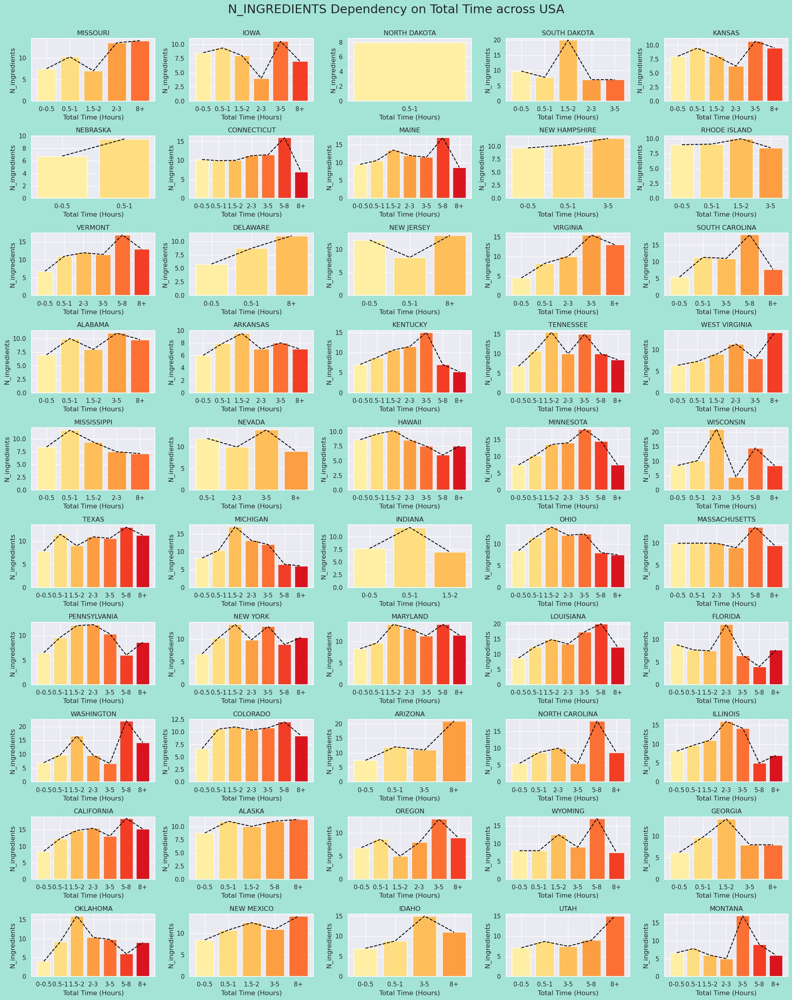

In [63]:
plot_time_relation(eda_df_states,'n_ingredients','USA')

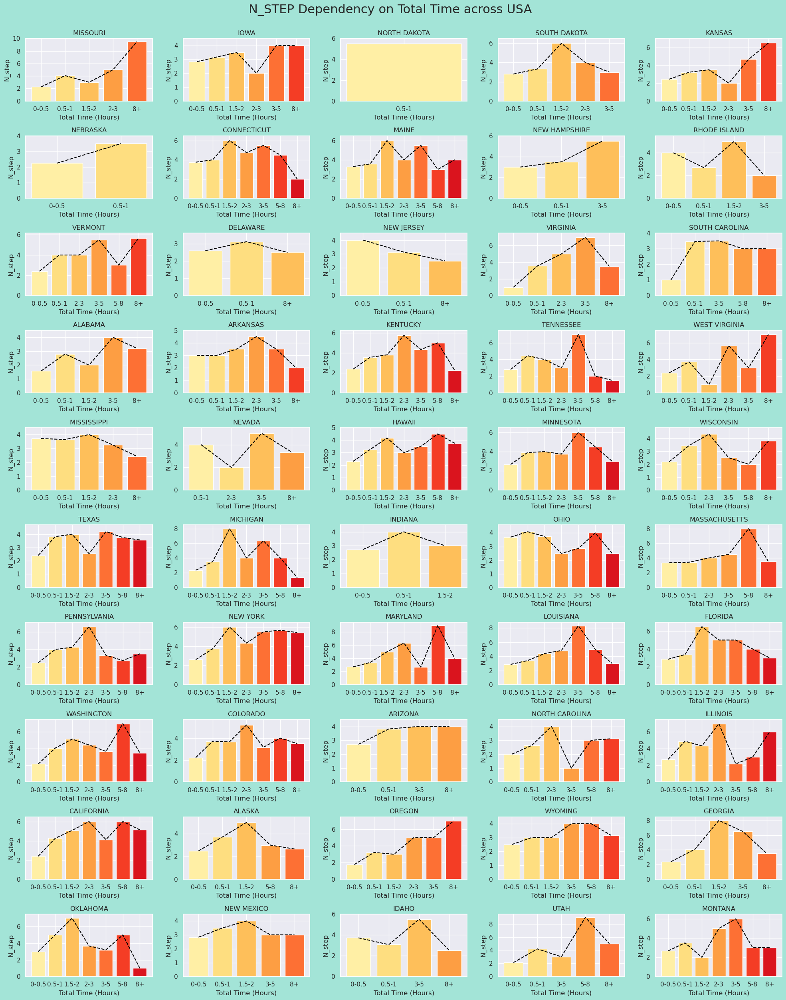

In [64]:
plot_time_relation(eda_df_states,'n_step','USA')

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>The Above graphs represent no of steps required to prepare a dish vs the total time required to cook the dish including prep time and cooking time but as we can see most of the countries doesn't have exponential growth as no of steps increases.</li>
    </ul>
</div> 

<h1 style="text-align:center;background-color:#EC7063; color:white" >What is the distribution of recipe ratings for different recipe types, and which recipe type has the highest overall rating count based on the plot? </h1>

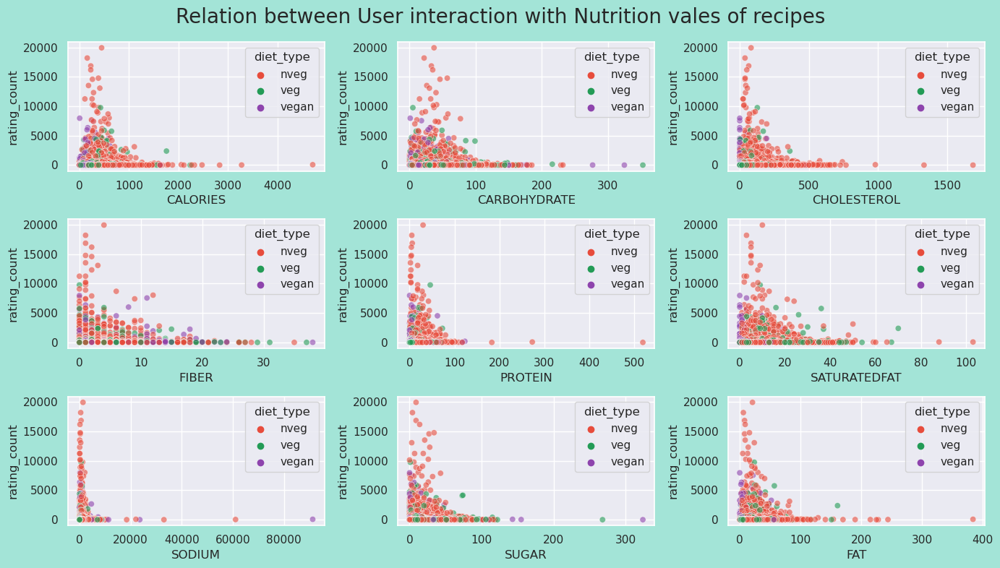

In [65]:
fig, axs = plt.subplots(3,3, figsize = (14,8))
fig.set_facecolor('#A3E4D7')
palette = {'vegan': '#8E44AD', 'nveg': '#E74C3C', 'veg': '#239B56'}
ax = axs.ravel()

for i, col in enumerate(list(EDA_master_df.iloc[:,10:19].columns)):
    sns.scatterplot(data=EDA_master_df, x=col, y="rating_count", ax=ax[i],palette = palette,hue = 'diet_type',alpha=0.6)
    ax[i].set_xlabel(f"{col.split('C')[0].upper()}")
fig.suptitle('Relation between User interaction with Nutrition vales of recipes',fontsize=20)
fig.tight_layout()
fig.savefig('Relation between User interaction with Nutrition vales of recipes.png',dpi=200)
plt.show()

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li> we determine from the plot that non_veg recipes are more popular among the world based on the rating count</li>
    </ul>
</div>

<h1 style="text-align:center;background-color:#EC7063; color:white" >How does the nutrient content of three different diets (vegan, nveg, and veg) compare and what are the potential health benefits of each diet based on the nutrient composition?</h1>

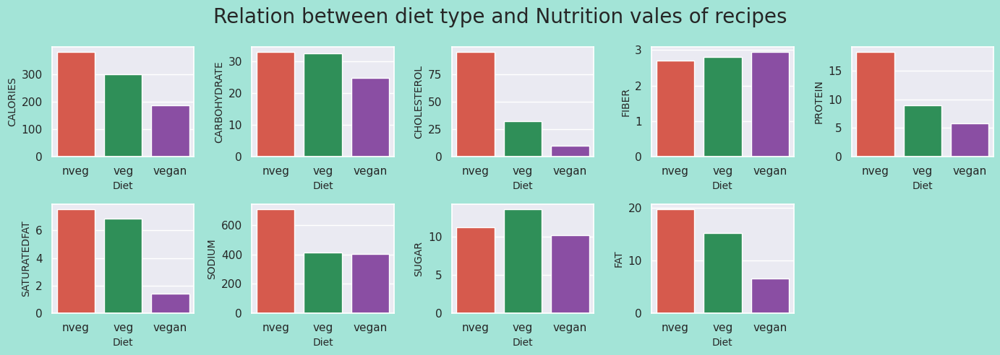

In [66]:
# and compare the average nutritional values for each diet type (nveg, veg, vegan) based on the data
list_ = list(EDA_master_df.iloc[:,10:19].columns)+['diet_type']
df_diet = EDA_master_df.loc[:, list_]
df_diet_group = pd.DataFrame((df_diet.groupby("diet_type").mean()))
fig, axs = plt.subplots(2,5, figsize = (14,5))
fig.set_facecolor('#A3E4D7')
palette = {'vegan': '#8E44AD', 'nveg': '#E74C3C', 'veg': '#239B56'}
ax = axs.ravel()
for i in range(len(list_)-1):
    sns.barplot(data=df_diet_group, x=df_diet_group.index,y =  df_diet_group.columns[i], ax=ax[i], palette=palette, saturation=0.8)
    ax[i].set_xlabel(list_[-1].split('_')[0].capitalize(),fontsize=10)
    ax[i].set_ylabel(list_[i].split('C')[0].upper(),fontsize=10)
ax[-1].remove()
fig.suptitle('Relation between diet type and Nutrition vales of recipes',fontsize=20)
fig.tight_layout()
fig.savefig('Relation between diet type and Nutrition vales of recipes.png',dpi=200)
plt.show()

<div class="alert alert-warning" role="alert">
    <b>Observations :</b>
    <ul>
        <li>we can observe that the vegan diet has the lowest calories, carbohydrate and saturated fat content, which may be beneficial for weight management and heart health. On the other hand, the nveg diet has the highest protein content, which may be beneficial for muscle building and maintenance. The veg diet falls in between the other two diets in terms of its nutrient content.</li>
    </ul>
</div> 

<h1 style="text-align:center;background-color:#EC7063; color:white" >Word Cloud of Ingredients </h1>

![word cloud](https://i.imgur.com/I8KQxd1.png)

<nav aria-label="The Sentient Chef">
  <ul class="pagination">
    <li class="page-item"><a class="page-link" href="https://www.kaggle.com/code/karthikrathod/the-sentient-chef-scrapping-notebook">1. Setting Sail on the Recipe Hunt </a></li>
    <li class="page-item"><a class="page-link" href="https://www.kaggle.com/karthikrathod/the-sentient-chef-data-manipulation-analysis">2. Navigating the Choppy Waters of Preprocessing</a></li>
    <li class="page-item"><a class="page-link" href="https://www.kaggle.com/karthikrathod/the-sentient-chef-eda">3. Surveying the Seas of Recipe Data 📌</a></li>
    <li class="page-item"><a class="page-link" href="https://www.kaggle.com/swarnava007/the-sentient-chef-maps">4. Mapping the Culinary World </a></li>
    <li class="page-item"><a class="page-link" href="https://www.kaggle.com/code/karthikrathod/recipes-recommendation">5. Sailing Towards Sentience</a></li>
  </ul>
</nav>